In [ ]:
#pip install geopandas

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import xml.etree.ElementTree as ET
import zipfile
import os

# Load the main dataset (residents with accessibility scores)
residents_df = pd.read_csv("DelhiScoreV1.csv")

In [2]:
# Helper function to parse KML and return GeoDataFrame
def parse_kml_to_gdf(kml_path, feature_type="Point"):
    # Parse XML from KML
    tree = ET.parse(kml_path)
    root = tree.getroot()

    # Find the namespace
    namespace = {'kml': 'http://www.opengis.net/kml/2.2'}

    # Extract names and coordinates
    names = []
    coords = []

    for placemark in root.findall('.//kml:Placemark', namespace):
        name = placemark.find('kml:name', namespace)
        coord = placemark.find('.//kml:coordinates', namespace)
        if name is not None and coord is not None:
            names.append(name.text)
            coord_text = coord.text.strip()
            lon, lat, *_ = map(float, coord_text.split(','))
            coords.append(Point(lon, lat))

    gdf = gpd.GeoDataFrame({'name': names, 'geometry': coords}, crs="EPSG:4326")
    return gdf

# Load facilities
schools_gdf = parse_kml_to_gdf("delhi_all_schools.kml")
metro_gdf = parse_kml_to_gdf("delhi_metro_stations.kml")

# Create GeoDataFrame for residents
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)


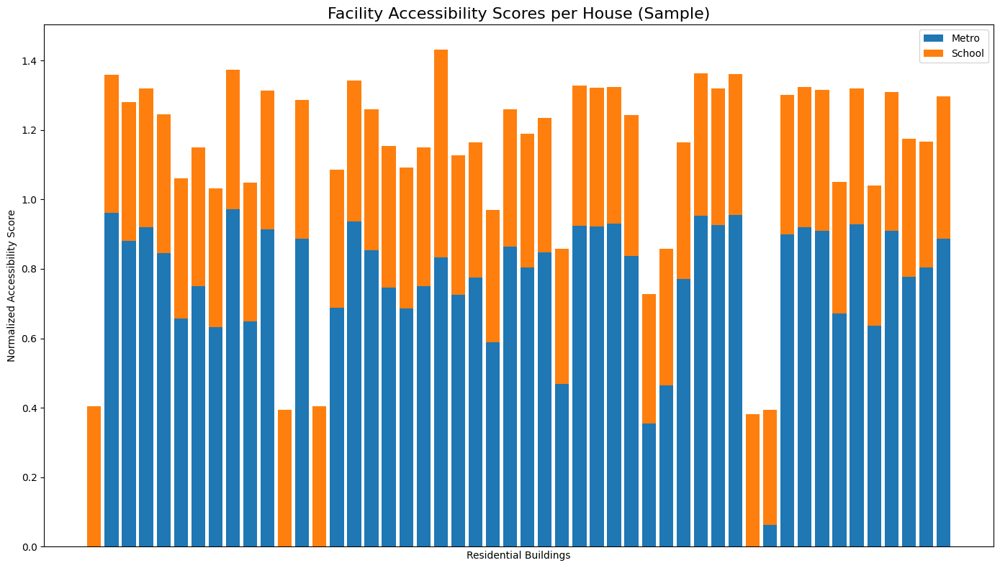

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Normalize Metro and School scores
score_cols = ['Metro_Score', 'School_Score']
scaler = MinMaxScaler()

residents_df[['Metro_Score_Norm', 'School_Score_Norm']] = scaler.fit_transform(
    residents_df[score_cols]
)

# Take a sample for plotting (e.g. 50 buildings)
sample_residents = residents_df.sample(50, random_state=42)

# Plot stacked bar chart
fig, ax = plt.subplots(figsize=(14, 8))

# Plot Metro normalized scores
ax.bar(sample_residents['Building'], sample_residents['Metro_Score_Norm'], label='Metro')

# Stack School on top of Metro
ax.bar(
    sample_residents['Building'],
    sample_residents['School_Score_Norm'],
    bottom=sample_residents['Metro_Score_Norm'],
    label='School'
)

# Labels and formatting
ax.set_title('Facility Accessibility Scores per House (Sample)', fontsize=16)
ax.set_xlabel('Residential Buildings')
ax.set_ylabel('Normalized Accessibility Score')
ax.legend()
ax.tick_params(axis='x', which='both', bottom=False, labelbottom=False)  # Hide long x-axis labels

plt.tight_layout()
plt.show()


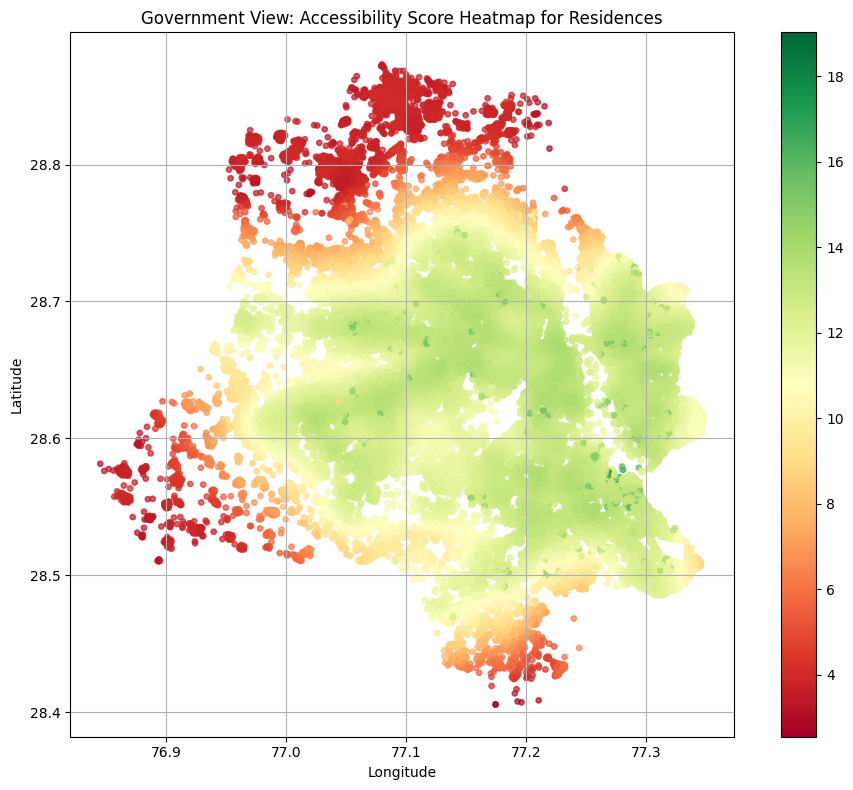

In [4]:
# Calculate a total accessibility score for each residence
residents_gdf['Total_Score'] = residents_gdf[['Metro_Score', 'School_Score']].sum(axis=1)

# Plot heatmap-like scatter of total scores
fig, ax = plt.subplots(figsize=(10, 8))
residents_gdf.plot(
    ax=ax,
    column='Total_Score',
    cmap='RdYlGn',
    legend=True,
    markersize=15,
    alpha=0.7
)
plt.title("Government View: Accessibility Score Heatmap for Residences")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()


In [5]:
from shapely.geometry import Point

# Simulate new facilities being added in underserved areas
new_schools = gpd.GeoDataFrame(geometry=[
    Point(77.56, 13.01), Point(77.58, 13.03), Point(77.62, 12.96)
], crs="EPSG:4326")

new_toilets = gpd.GeoDataFrame(geometry=[
    Point(77.55, 13.00), Point(77.57, 12.98), Point(77.63, 12.95)
], crs="EPSG:4326")

In [6]:
pip install pyproj

Note: you may need to restart the kernel to use updated packages.


In [7]:
# Ensure CRS is set before combining
if schools_gdf.crs is None:
    schools_gdf = schools_gdf.set_crs("EPSG:4326")
if metro_gdf.crs is None:
    metro_gdf = metro_gdf.set_crs("EPSG:4326")

# Combine both GeoDataFrames
facilities_raw = pd.concat([schools_gdf, metro_gdf], ignore_index=True)

# Keep only valid and non-null geometries
facilities_clean = facilities_raw[facilities_raw.geometry.notnull() & facilities_raw.is_valid]

print("Combined raw shape:", facilities_raw.shape)
print("Cleaned shape after filtering:", facilities_clean.shape)

# Reproject to metric CRS for density calculation
facilities_gdf = facilities_clean.to_crs(epsg=3857)

# Extract coordinates
x = facilities_gdf.geometry.x
y = facilities_gdf.geometry.y

print("Facility count:", len(facilities_gdf))
print("X range:", x.min(), x.max())
print("Y range:", y.min(), y.max())

if len(facilities_gdf) == 0:
    print("⚠️ Still no valid facilities to plot.")
else:
    fig, ax = plt.subplots(figsize=(10, 8))
    hb = ax.hexbin(x, y, gridsize=50, cmap='plasma', mincnt=1)
    cb = fig.colorbar(hb, ax=ax)
    cb.set_label("Number of Facilities per Hex")

    ax.set_title("Urban Planners View: Facility Density Map", fontsize=16)
    ax.set_xlabel("Easting (meters)")
    ax.set_ylabel("Northing (meters)")
    plt.tight_layout()
    plt.show()


Combined raw shape: (0, 2)
Cleaned shape after filtering: (0, 2)
Facility count: 0
X range: nan nan
Y range: nan nan
⚠️ Still no valid facilities to plot.


In [8]:
import geopandas as gpd
schools_gdf = gpd.read_file("delhi_metro_stations.kml", driver='KML')
metro_gdf = gpd.read_file("delhi_all_schools.kml", driver='KML')


In [9]:
# Check KML file actually exists and isn't empty
import os
print("Metro file exists?", os.path.exists("delhi_metro_stations.kml"))
print("School file exists?", os.path.exists("delhi_all_schools.kml"))


Metro file exists? True
School file exists? True


In [10]:
#pip install geopy

In [11]:
from geopy.distance import geodesic
import numpy as np

In [12]:
# Select 6 buildings randomly for simulation
selected_residents = residents_gdf.sample(6, random_state=1).copy()

# Define new toilet location (near the selected buildings)
new_facility_location = Point(77.58, 13.00)

# Function to update scores based on proximity (simulate a benefit)
def simulate_score_change(row, new_point, threshold_km=1.0):
    dist = geodesic((row.geometry.y, row.geometry.x), (new_point.y, new_point.x)).km
    if dist < threshold_km:
        return min(row['Metro_Score'] + (1 - dist / threshold_km) * 2.0, 10.0)  # boost score up to max 10
    return row['Metro_Score']

# Apply simulation
selected_residents['New_Metro_Score'] = selected_residents.apply(
    lambda row: simulate_score_change(row, new_facility_location), axis=1)

# Plot before and after scores for the selected buildings
labels = selected_residents['Building']
before_scores = selected_residents['Metro_Score']
after_scores = selected_residents['New_Metro_Score']

x = np.arange(len(labels))  # label locations
width = 0.35  # width of the bars



In [13]:
print(selected_residents.crs)
print(selected_residents.geometry.head())
print(new_facility_location)

EPSG:4326
47500    POINT (76.97917 28.54137)
44471    POINT (76.99444 28.70143)
25831    POINT (76.99729 28.67282)
43791    POINT (77.26383 28.70704)
1890      POINT (77.1509 28.65088)
Name: geometry, dtype: geometry
POINT (77.58 13)


In [14]:
selected_residents = selected_residents.set_crs("EPSG:4326", allow_override=True)


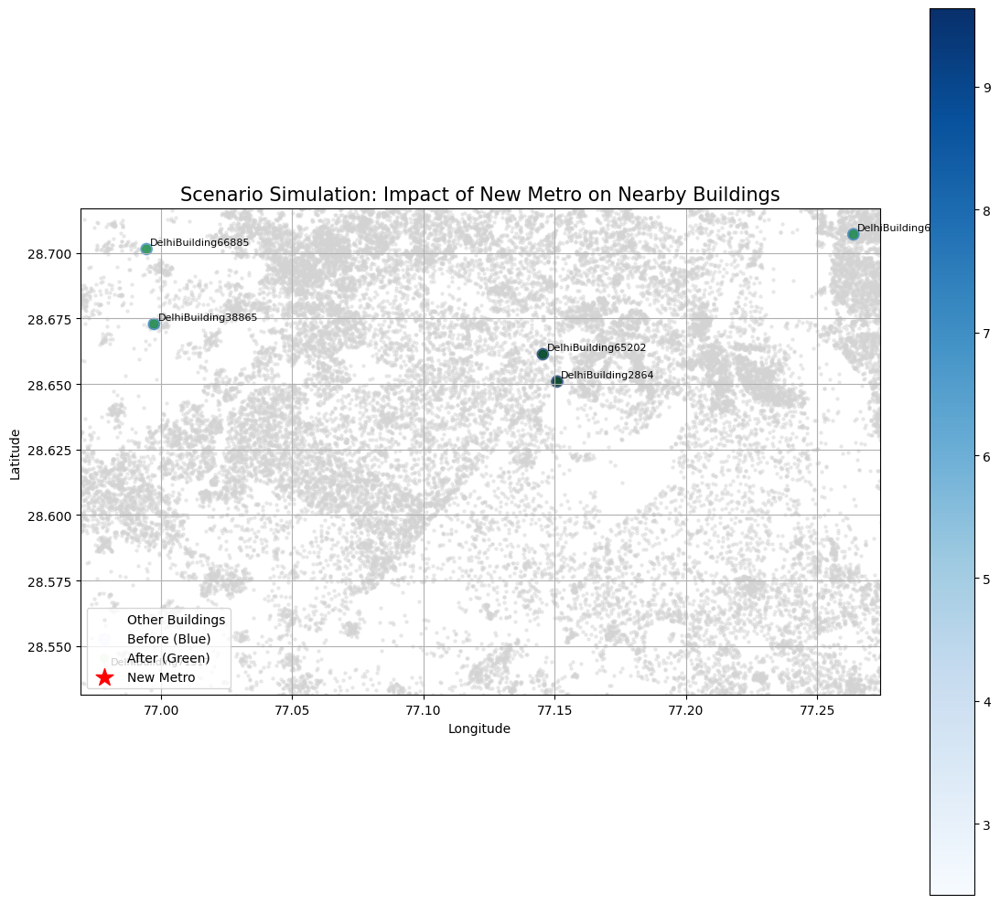

In [15]:
fig, ax = plt.subplots(figsize=(12, 10))

# Plot base layer
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.4, label='Other Buildings')

# Plot BEFORE scores (blue)
selected_residents.plot(
    ax=ax,
    column='Metro_Score',
    cmap='Blues',
    markersize=80,
    legend=True,
    alpha=0.6
)

# Plot AFTER scores (green, smaller)
selected_residents.plot(
    ax=ax,
    column='New_Metro_Score',
    cmap='Greens',
    markersize=40,
    legend=False,
    alpha=0.8
)

# Plot the new Metro point
gpd.GeoSeries([new_facility_location], crs="EPSG:4326").plot(
    ax=ax, color='red', marker='*', markersize=200, label='New Metro'
)

# Annotate each building
for idx, row in selected_residents.iterrows():
    ax.annotate(
        row['Building'],
        xy=(row.geometry.x, row.geometry.y),
        xytext=(3, 3),
        textcoords='offset points',
        fontsize=8
    )

# Set proper aspect ratio and zoom
ax.set_aspect('equal')  # Maintain 1:1 scale

# Zoom to selection + buffer
buffer = 0.01  # degrees ≈ 1km
xmin, ymin, xmax, ymax = selected_residents.total_bounds
ax.set_xlim(xmin - buffer, xmax + buffer)
ax.set_ylim(ymin - buffer, ymax + buffer)

# Final polish
ax.set_title("Scenario Simulation: Impact of New Metro on Nearby Buildings", fontsize=15)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend(["Other Buildings", "Before (Blue)", "After (Green)", "New Metro"])
plt.grid(True)
plt.tight_layout()
plt.show()


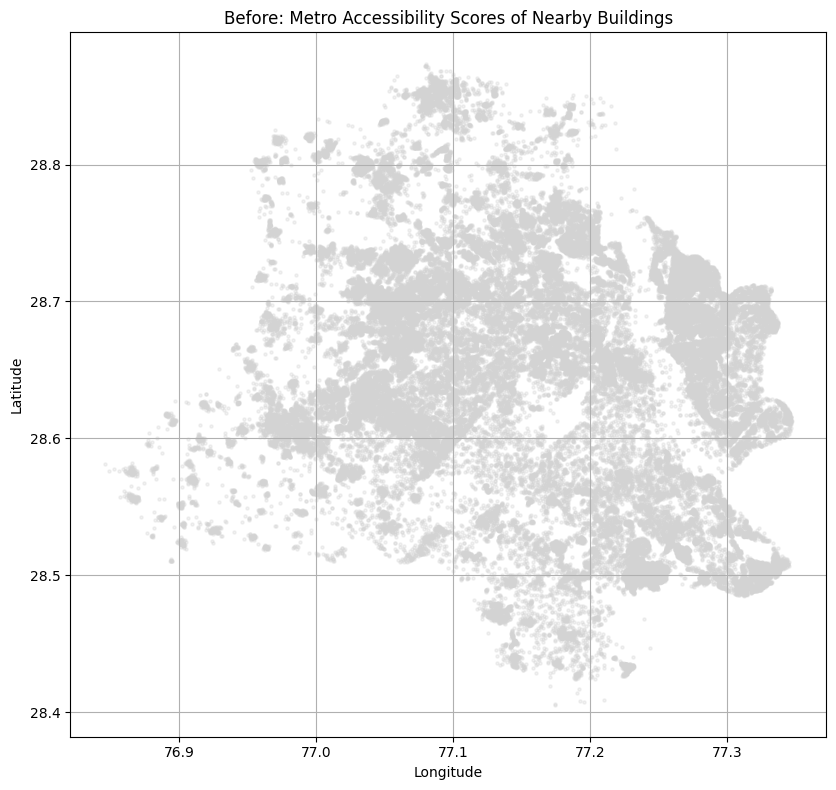

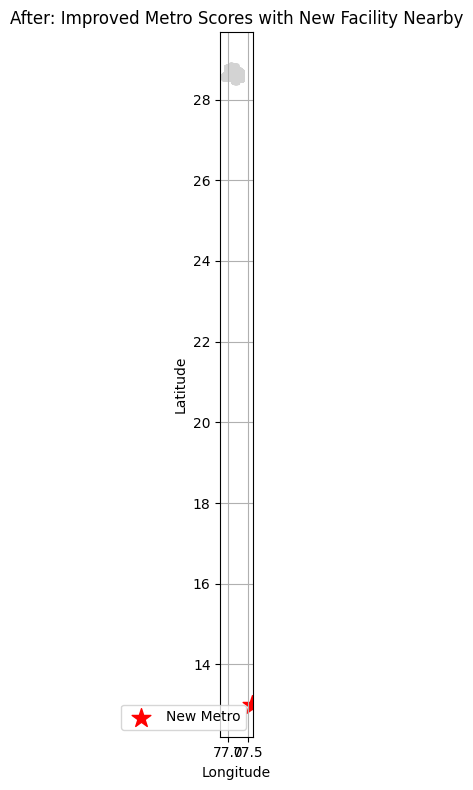

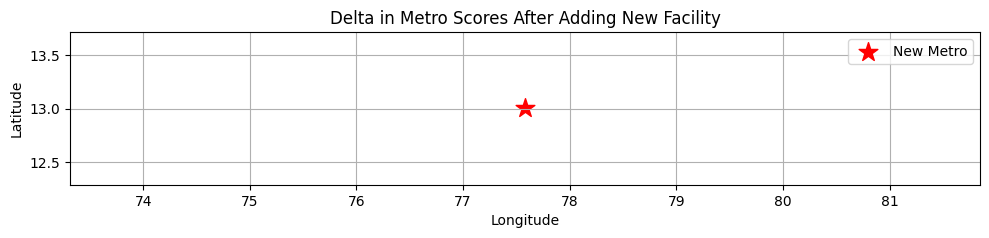

In [16]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point
from geopy.distance import geodesic

# -------------------------------
# Step 1: Define new metro facility location
# -------------------------------
new_facility_location = Point(77.581, 13.002)

# -------------------------------
# Step 2: Select 20 buildings near a central point (within 1km buffer)
# -------------------------------
central_point = Point(77.58, 13.00)
buffer_radius = 0.01  # ~1.1 km

nearby_residents = residents_gdf[residents_gdf.geometry.within(central_point.buffer(buffer_radius))].copy()
nearby_residents = nearby_residents.head(20)

# -------------------------------
# Step 3: Simulate score increase and delta
# -------------------------------
def simulate_with_delta(row, facility_point, boost=1.5, radius_km=1.2):
    distance = geodesic((row.geometry.y, row.geometry.x), (facility_point.y, facility_point.x)).km
    if distance < radius_km:
        new_score = min(row['Metro_Score'] + (1 - distance / radius_km) * boost, 10.0)
        delta = new_score - row['Metro_Score']
    else:
        new_score = row['Metro_Score']
        delta = 0
    return pd.Series({'New_Metro_Score': new_score, 'Delta': delta})

# -------------------------------
# Step 4: Apply simulation and safely merge
# -------------------------------
result_df = nearby_residents.apply(lambda row: simulate_with_delta(row, new_facility_location), axis=1)

# Ensure 'geometry' is not duplicated
if 'geometry' in result_df.columns:
    result_df = result_df.drop(columns=['geometry'])

# Drop duplicate columns (if any)
geometry_column_count = nearby_residents.columns.tolist().count('geometry')
if geometry_column_count > 1:
    nearby_residents = nearby_residents.loc[:, ~nearby_residents.columns.duplicated()]

# Combine and re-wrap as GeoDataFrame
combined = pd.concat([nearby_residents.reset_index(drop=True), result_df.reset_index(drop=True)], axis=1)
nearby_residents = gpd.GeoDataFrame(combined, geometry='geometry', crs="EPSG:4326")

# -------------------------------
# Step 5: Plot - BEFORE Metro scores
# -------------------------------
fig, ax = plt.subplots(figsize=(10, 8))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3, label='Other Buildings')

if not nearby_residents.empty and 'Metro_Score' in nearby_residents.columns:
    nearby_residents.plot(ax=ax, column='Metro_Score', cmap='Blues', markersize=80, legend=True)

ax.set_title("Before: Metro Accessibility Scores of Nearby Buildings")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_aspect('equal')
ax.grid(True)
plt.tight_layout()
plt.show()

# -------------------------------
# Step 6: Plot - AFTER Metro scores
# -------------------------------
fig, ax = plt.subplots(figsize=(10, 8))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)

if not nearby_residents.empty and 'New_Metro_Score' in nearby_residents.columns:
    nearby_residents.plot(ax=ax, column='New_Metro_Score', cmap='Greens', markersize=80, legend=True)

gpd.GeoSeries([new_facility_location], crs="EPSG:4326").plot(
    ax=ax, color='red', marker='*', markersize=200, label='New Metro'
)

ax.set_title("After: Improved Metro Scores with New Facility Nearby")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_aspect('equal')
ax.legend()
ax.grid(True)
plt.tight_layout()
plt.show()

# -------------------------------
# Step 7: Plot - Delta Score Changes
# -------------------------------
fig, ax = plt.subplots(figsize=(10, 8))

if not nearby_residents.empty and 'Delta' in nearby_residents.columns:
    nearby_residents.plot(ax=ax, column='Delta', cmap='coolwarm', markersize=80, legend=True)

gpd.GeoSeries([new_facility_location], crs="EPSG:4326").plot(
    ax=ax, color='red', marker='*', markersize=200, label='New Metro'
)

ax.set_title("Delta in Metro Scores After Adding New Facility")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_aspect('equal')
ax.legend()
ax.grid(True)
plt.tight_layout()
plt.show()


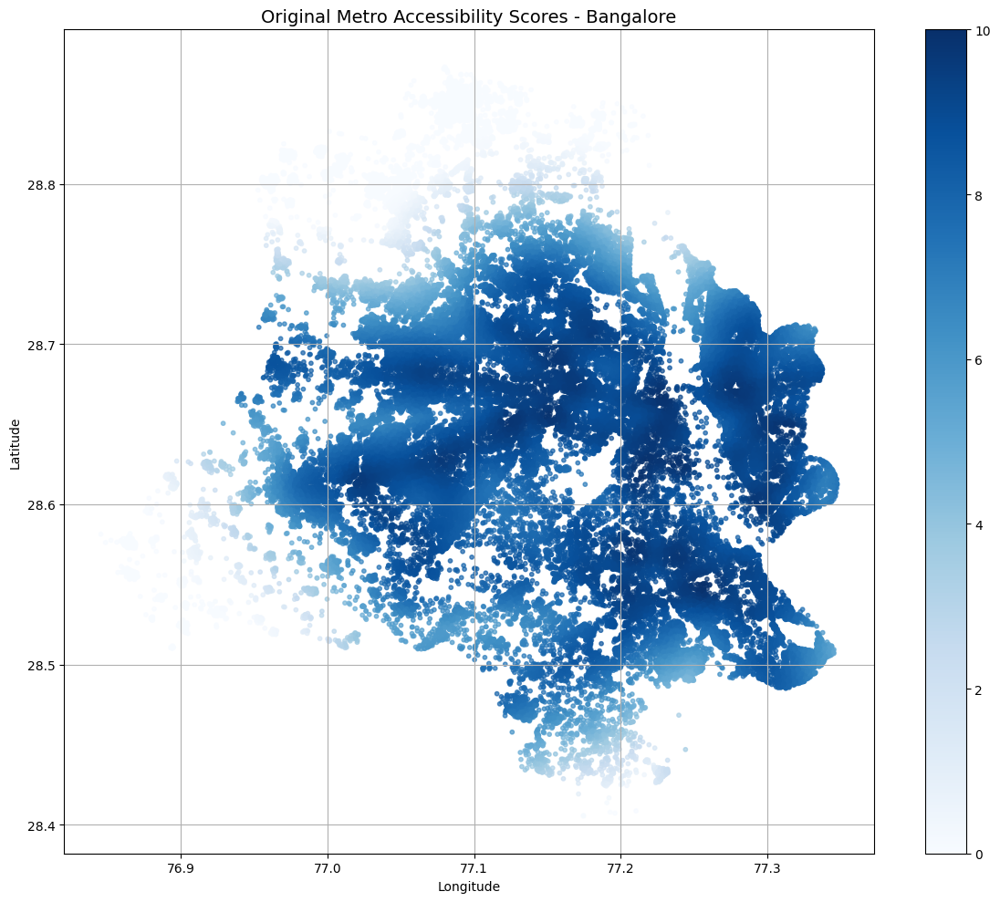

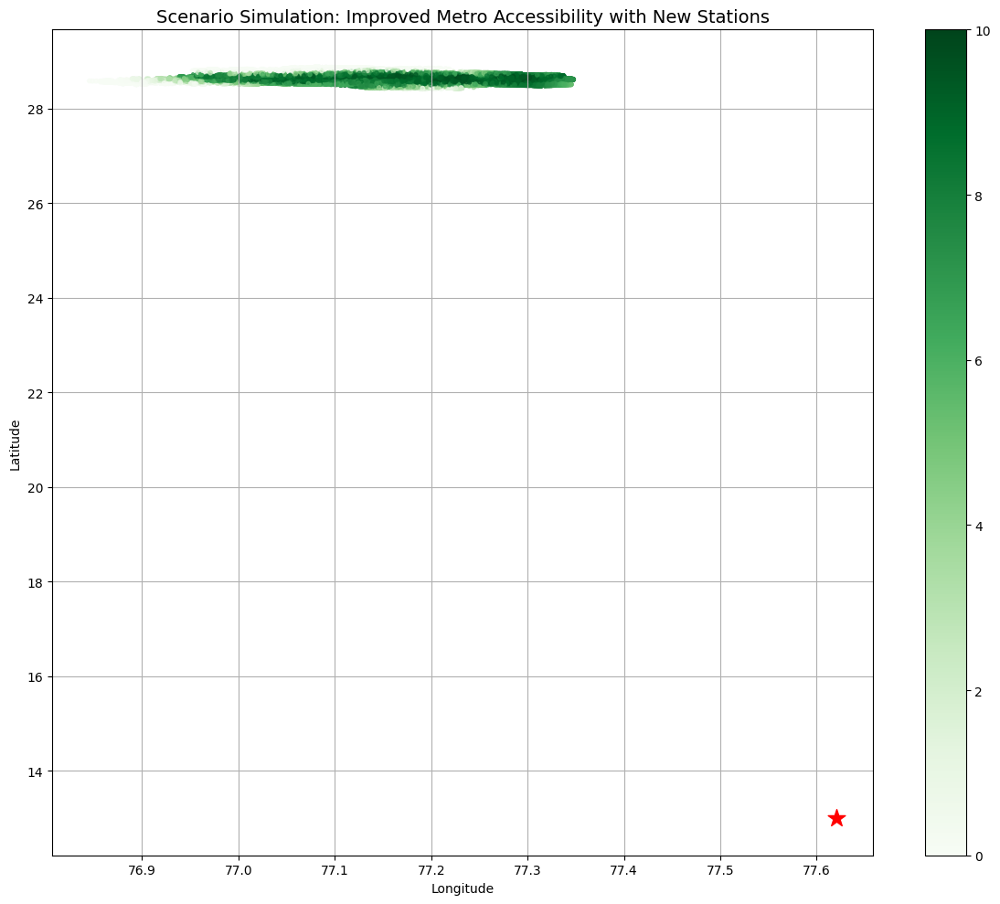

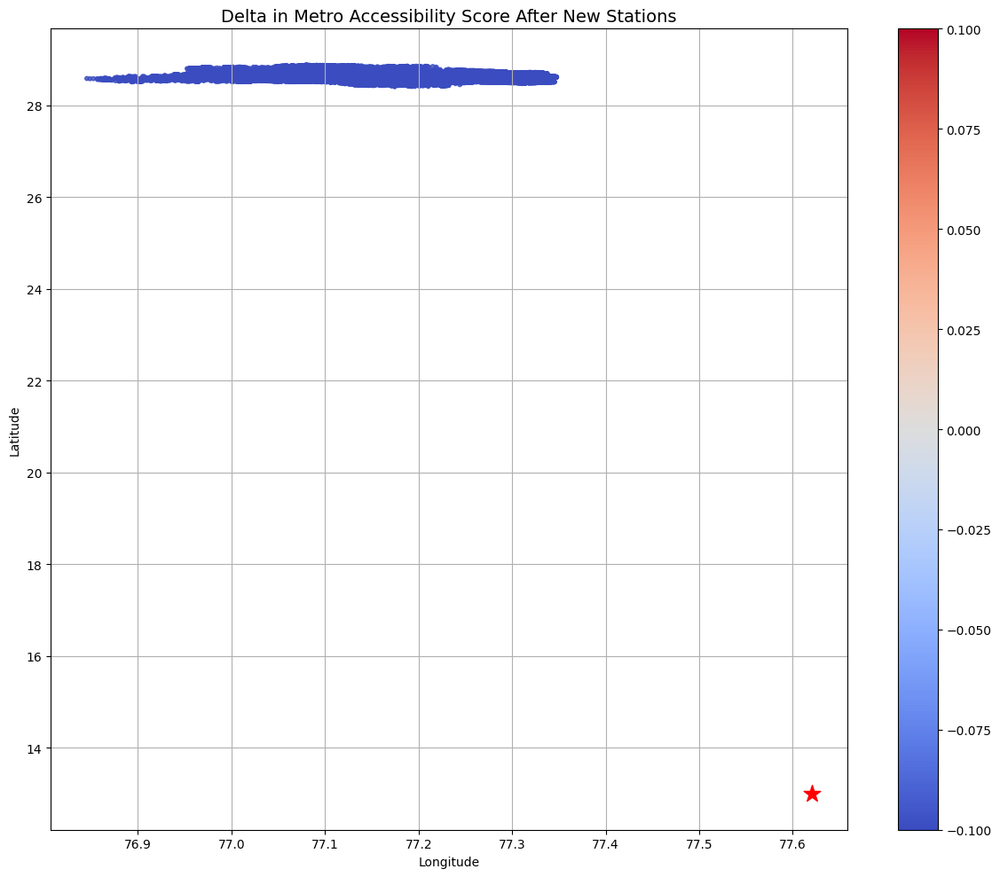

In [17]:
from shapely.geometry import Point
from geopy.distance import geodesic
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Define new facilities
new_facilities = gpd.GeoDataFrame({
    'name': ['New School', 'New Metro'],
    'type': ['School', 'Metro'],
    'geometry': [
        Point(77.60, 12.97),
        Point(77.62, 13.01)
    ]
}, crs="EPSG:4326")

# Step 2: Boost scoring logic
def compute_total_boost(row, facility_gdf, score_col):
    base_score = row[score_col]
    boost = 0
    for _, facility in facility_gdf.iterrows():
        dist_km = geodesic((row.geometry.y, row.geometry.x), (facility.geometry.y, facility.geometry.x)).km
        if dist_km < 1.2:
            boost += (1 - dist_km / 1.2) * 1.5
    return min(base_score + boost, 10.0)

# Step 3: Apply boost
bangalore_scenario = residents_gdf.copy()
bangalore_scenario['Metro_Score_New'] = bangalore_scenario.apply(
    lambda row: compute_total_boost(row, new_facilities[new_facilities.type == 'Metro'], 'Metro_Score'), axis=1)
bangalore_scenario['School_Score_New'] = bangalore_scenario.apply(
    lambda row: compute_total_boost(row, new_facilities[new_facilities.type == 'School'], 'School_Score'), axis=1)

# Optional: compute delta
bangalore_scenario['Metro_Score_Diff'] = bangalore_scenario['Metro_Score_New'] - bangalore_scenario['Metro_Score']

# Helper to safely plot new metro points
def plot_metros_if_available(ax):
    metros = new_facilities[new_facilities['type'] == 'Metro']
    if not metros.empty:
        metros.plot(ax=ax, color='red', marker='*', markersize=200, label='New Metro')

# Step 4: Plot original scores
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score', cmap='Blues', markersize=10, legend=True, alpha=0.7)
ax.set_title("Original Metro Accessibility Scores - Bangalore", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True)
ax.set_aspect('auto')  # allow auto if bounds may be off
plt.tight_layout()
plt.show()

# Step 5: Plot improved scores
fig, ax = plt.subplots(figsize=(12, 10))
bangalore_scenario.plot(ax=ax, column='Metro_Score_New', cmap='Greens', markersize=10, legend=True, alpha=0.7)
plot_metros_if_available(ax)
ax.set_title("Scenario Simulation: Improved Metro Accessibility with New Stations", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True)
ax.set_aspect('auto')
plt.tight_layout()
plt.show()

# Step 6: Plot the delta
fig, ax = plt.subplots(figsize=(12, 10))
bangalore_scenario.plot(ax=ax, column='Metro_Score_Diff', cmap='coolwarm', markersize=10, legend=True, alpha=0.8)
plot_metros_if_available(ax)
ax.set_title("Delta in Metro Accessibility Score After New Stations", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True)
ax.set_aspect('auto')
plt.tight_layout()
plt.show()


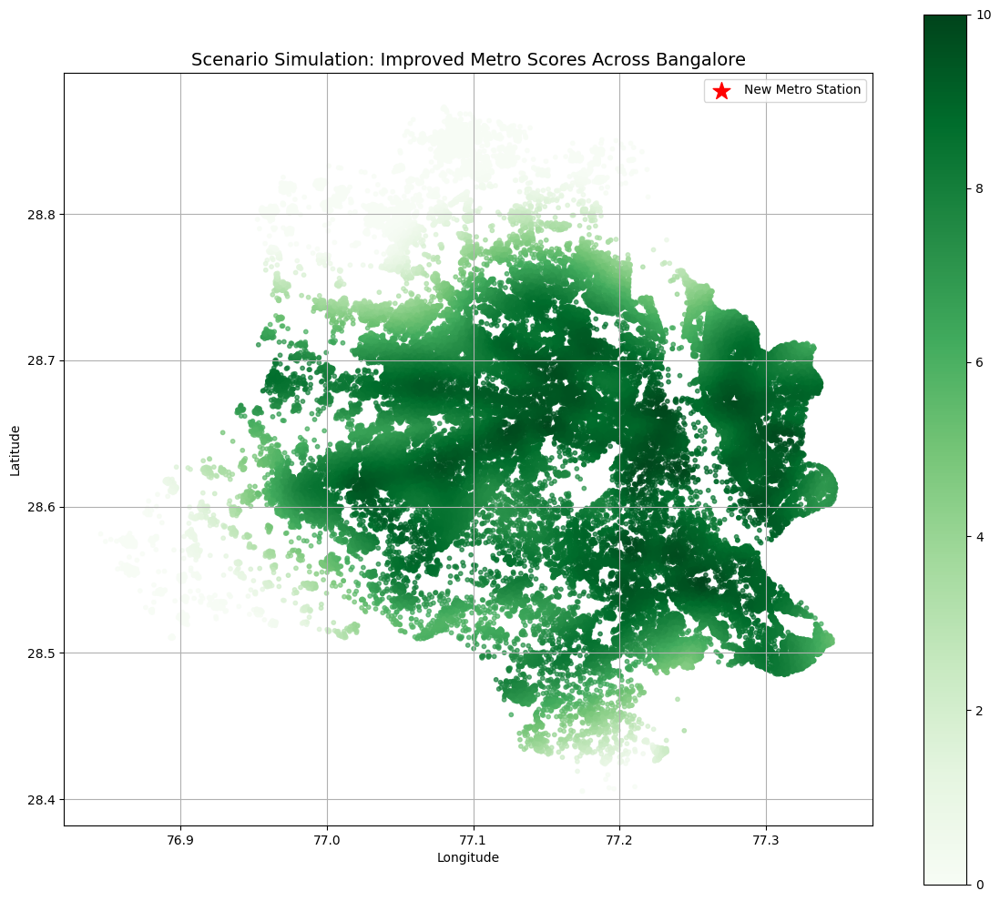

In [18]:
# Step 1: Ensure CRS is consistent
new_facilities_valid = new_facilities.to_crs(residents_gdf.crs)

# Step 2: Filter Metro-only facilities
new_metro_gdf = new_facilities_valid[new_facilities_valid['type'] == 'Metro']

# Step 3: Get bounds for a zoomed-in plot
xmin, ymin, xmax, ymax = bangalore_scenario.total_bounds
x_pad = (xmax - xmin) * 0.05
y_pad = (ymax - ymin) * 0.05

# Step 4: Plot map
fig, ax = plt.subplots(figsize=(12, 10))
bangalore_scenario.plot(ax=ax, column='Metro_Score_New', cmap='Greens', markersize=10, legend=True, alpha=0.7)

# Only plot metro stations if non-empty
if not new_metro_gdf.empty:
    new_metro_gdf.plot(ax=ax, color='red', marker='*', markersize=200, label='New Metro Station')

# Set correct limits and appearance
ax.set_xlim(xmin - x_pad, xmax + x_pad)
ax.set_ylim(ymin - y_pad, ymax + y_pad)
ax.set_aspect('equal')  # Fix aspect ratio
ax.set_title("Scenario Simulation: Improved Metro Scores Across Bangalore", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend()
ax.grid(True)
plt.tight_layout()
plt.show()


C:\Users\Apoorva\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


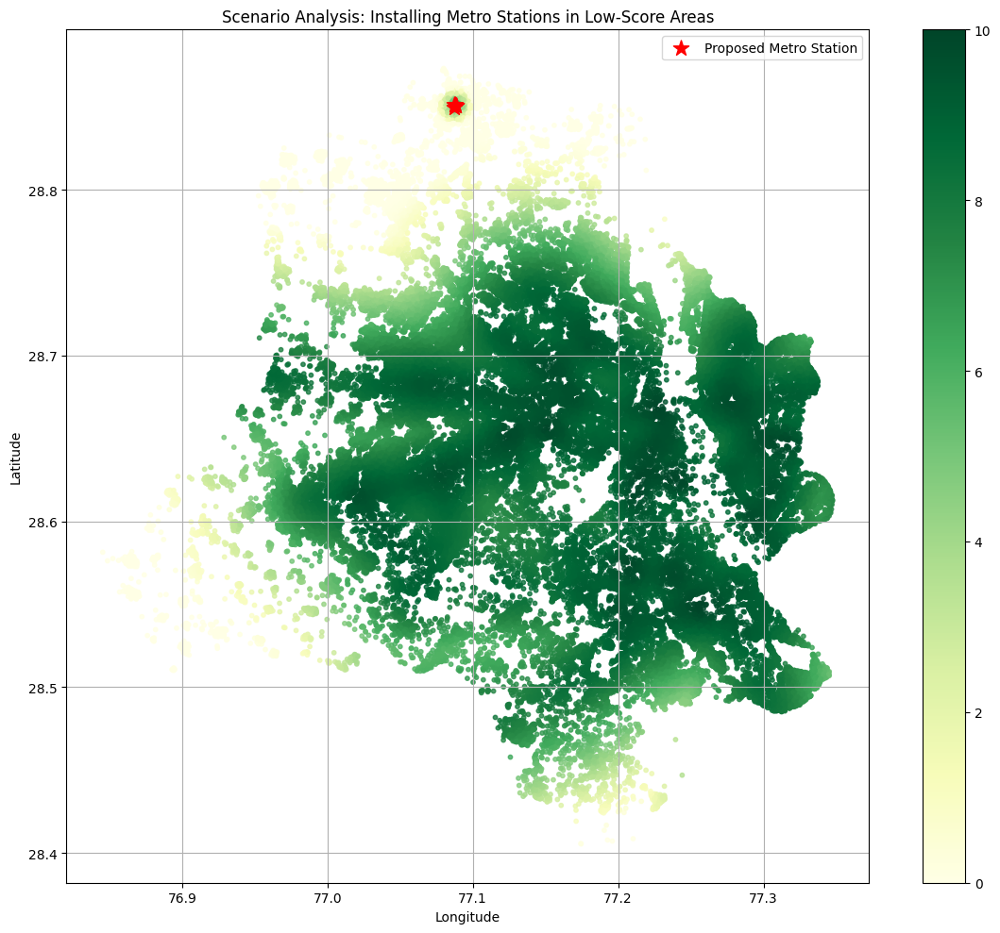

In [19]:
from sklearn.neighbors import KernelDensity
from scipy.ndimage import gaussian_filter
from matplotlib.colors import Normalize
import numpy as np

# Step 1: Identify low-score areas for Metro (e.g., bottom 10th percentile)
threshold = residents_gdf['Metro_Score'].quantile(0.1)
low_score_residents = residents_gdf[residents_gdf['Metro_Score'] <= threshold]

# Step 2: Use Kernel Density Estimation (KDE) to locate clusters of low-score points
# Convert lat/lon to numpy array for KDE
xy = np.vstack([low_score_residents.geometry.x, low_score_residents.geometry.y]).T

# Apply KDE
kde = KernelDensity(bandwidth=0.01, metric='euclidean', kernel='gaussian')
kde.fit(xy)
densities = kde.score_samples(xy)

# Get top 5 density locations (potential metro installation points)
low_score_residents['density'] = densities
top_locations = low_score_residents.sort_values('density', ascending=False).head(5)

# Convert to GeoDataFrame
new_metro_points = gpd.GeoDataFrame(geometry=top_locations.geometry, crs="EPSG:4326")
new_metro_points['name'] = [f'Proposed Metro {i+1}' for i in range(len(new_metro_points))]

# Step 3: Simulate improved scores across Bangalore
bangalore_scenario_multi = residents_gdf.copy()

def boost_from_multiple(row, points, column_name, max_boost=1.5, threshold_km=1.2):
    base = row[column_name]
    for pt in points.geometry:
        dist = geodesic((row.geometry.y, row.geometry.x), (pt.y, pt.x)).km
        if dist < threshold_km:
            base = min(base + (1 - dist / threshold_km) * max_boost, 10.0)
    return base

bangalore_scenario_multi['Metro_Score_Improved'] = bangalore_scenario_multi.apply(
    lambda r: boost_from_multiple(r, new_metro_points, 'Metro_Score'), axis=1)

# Step 4: Plot the improved scores with proposed metro locations
fig, ax = plt.subplots(figsize=(12, 10))
bangalore_scenario_multi.plot(ax=ax, column='Metro_Score_Improved', cmap='YlGn', markersize=10, legend=True, alpha=0.8)
new_metro_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Metro Station')

plt.title("Scenario Analysis: Installing Metro Stations in Low-Score Areas")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


100%|███████████████████████████████████████████████████████████████████████████| 62747/62747 [01:47<00:00, 585.00it/s]


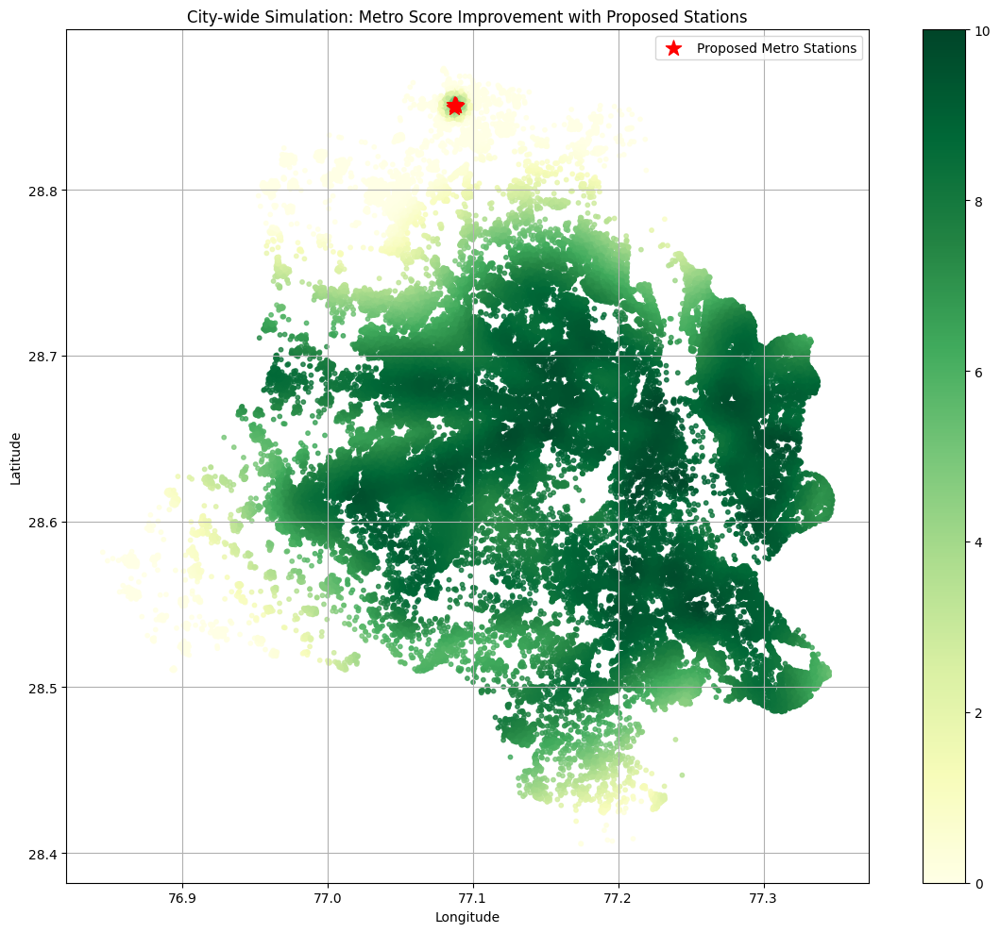

In [20]:
from geopy.distance import distance as geopy_distance
from tqdm import tqdm

# Convert proposed metro locations to lat/lon tuples
proposed_coords = [(pt.y, pt.x) for pt in new_metro_points.geometry]

# Vectorized improvement calculation: precompute all resident-to-station distances
def compute_score_boosts_vectorized(residents_gdf, proposed_coords, original_col='Metro_Score',
                                    new_col='Metro_Score_Improved', max_boost=1.5, threshold_km=1.2):
    improved_scores = []
    for idx, row in tqdm(residents_gdf.iterrows(), total=len(residents_gdf)):
        base_score = row[original_col]
        latlon = (row.geometry.y, row.geometry.x)
        for metro in proposed_coords:
            dist_km = geopy_distance(latlon, metro).km
            if dist_km < threshold_km:
                boost = (1 - dist_km / threshold_km) * max_boost
                base_score = min(base_score + boost, 10.0)
        improved_scores.append(base_score)
    residents_gdf[new_col] = improved_scores
    return residents_gdf

# Apply optimized scoring
bangalore_optimized = compute_score_boosts_vectorized(residents_gdf.copy(), proposed_coords)

# Plot the results
fig, ax = plt.subplots(figsize=(12, 10))
bangalore_optimized.plot(ax=ax, column='Metro_Score_Improved', cmap='YlGn', markersize=10, legend=True, alpha=0.8)
new_metro_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Metro Stations')

plt.title("City-wide Simulation: Metro Score Improvement with Proposed Stations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


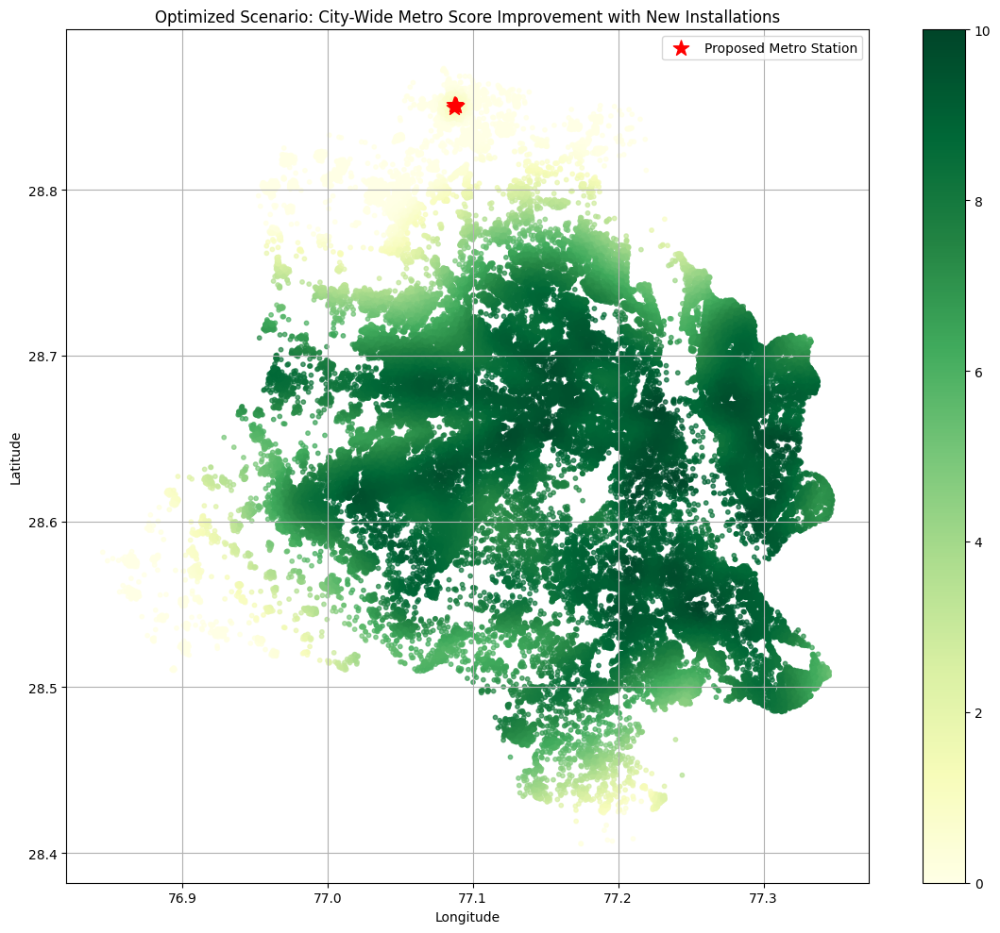

In [21]:
from shapely.ops import nearest_points
from shapely.geometry import Point
import numpy as np
from geopy.distance import great_circle

# Optimization using NumPy: precompute distances from all residences to new metro points
res_coords = np.array([(pt.y, pt.x) for pt in residents_gdf.geometry])
new_metro_coords = np.array([(pt.y, pt.x) for pt in new_metro_points.geometry])

# Function to calculate great-circle distance between arrays of coordinates
def compute_min_distances(res_coords, facility_coords):
    min_distances = []
    for res in res_coords:
        dists = [great_circle(res, fac).km for fac in facility_coords]
        min_distances.append(min(dists))
    return np.array(min_distances)

# Compute distances and simulate boost
min_dists = compute_min_distances(res_coords, new_metro_coords)
score_boost = np.clip((1 - min_dists / 1.2) * 1.5, 0, None)  # Boost decays over 1.2 km
improved_scores = np.clip(residents_gdf['Metro_Score'] + score_boost, 0, 10)

# Add to GeoDataFrame
residents_gdf['Metro_Score_Improved'] = improved_scores

# Plot the improved metro accessibility scores
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score_Improved', cmap='YlGn', markersize=10, legend=True, alpha=0.7)
new_metro_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Metro Station')
plt.title("Optimized Scenario: City-Wide Metro Score Improvement with New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


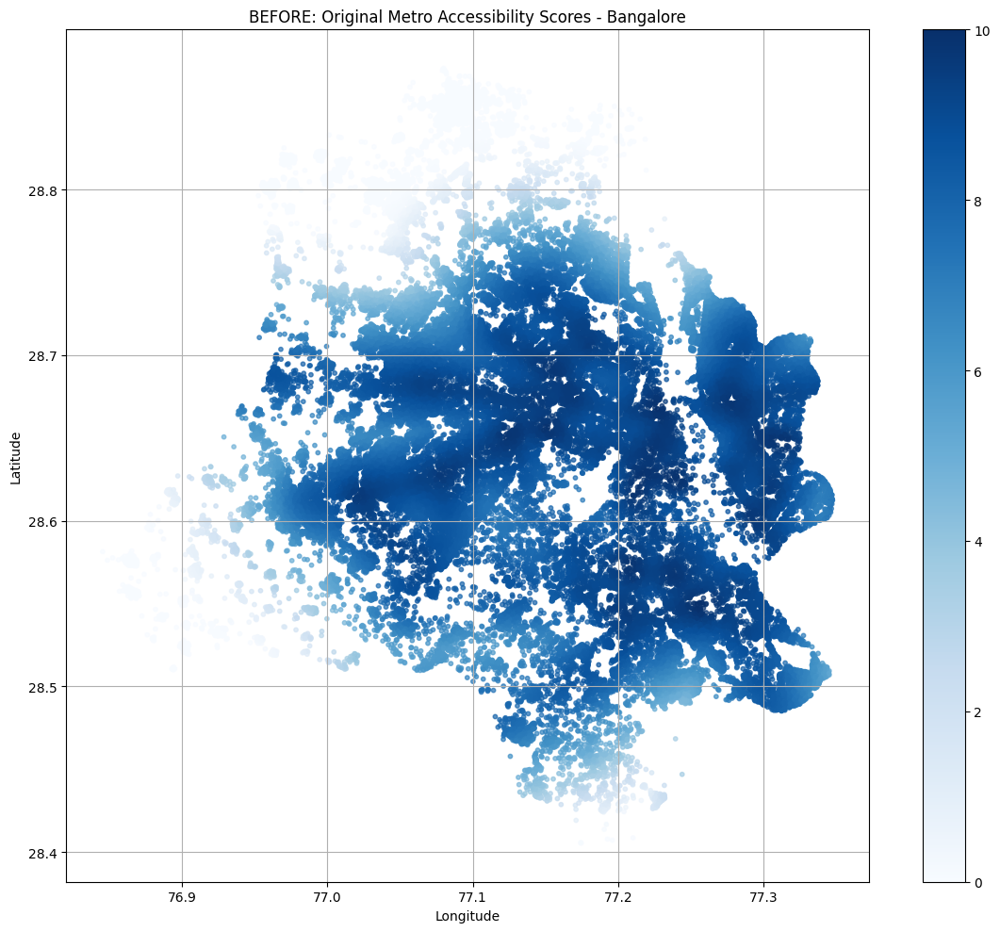

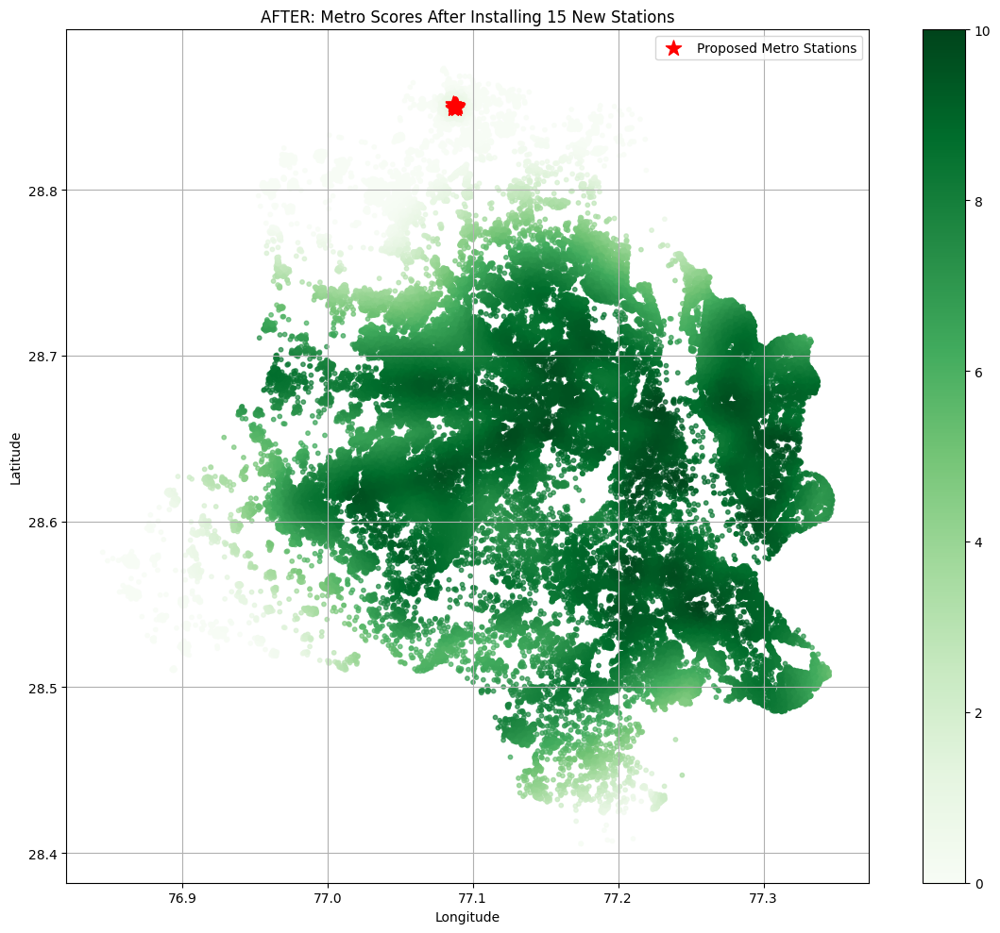

In [22]:
# Select top 15 densest low-score locations for new metro stations
top15_locations = low_score_residents.sort_values('density', ascending=False).head(15)
top15_metro_points = gpd.GeoDataFrame(geometry=top15_locations.geometry, crs="EPSG:4326")
top15_metro_points['name'] = [f'Proposed Metro {i+1}' for i in range(len(top15_metro_points))]

# Compute optimized distances and score improvements for all buildings in Bangalore
top15_coords = np.array([(pt.y, pt.x) for pt in top15_metro_points.geometry])
min_dists_15 = compute_min_distances(res_coords, top15_coords)
score_boost_15 = np.clip((1 - min_dists_15 / 1.2) * 1.5, 0, None)
improved_scores_15 = np.clip(residents_gdf['Metro_Score'] + score_boost_15, 0, 10)

# Store scores in dataframe for comparison
residents_gdf['Metro_Score_Improved_15'] = improved_scores_15

# Plot comparison: BEFORE
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score', cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title("BEFORE: Original Metro Accessibility Scores - Bangalore")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot comparison: AFTER
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score_Improved_15', cmap='Greens', markersize=10, legend=True, alpha=0.7)
top15_metro_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Metro Stations')
plt.title("AFTER: Metro Scores After Installing 15 New Stations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


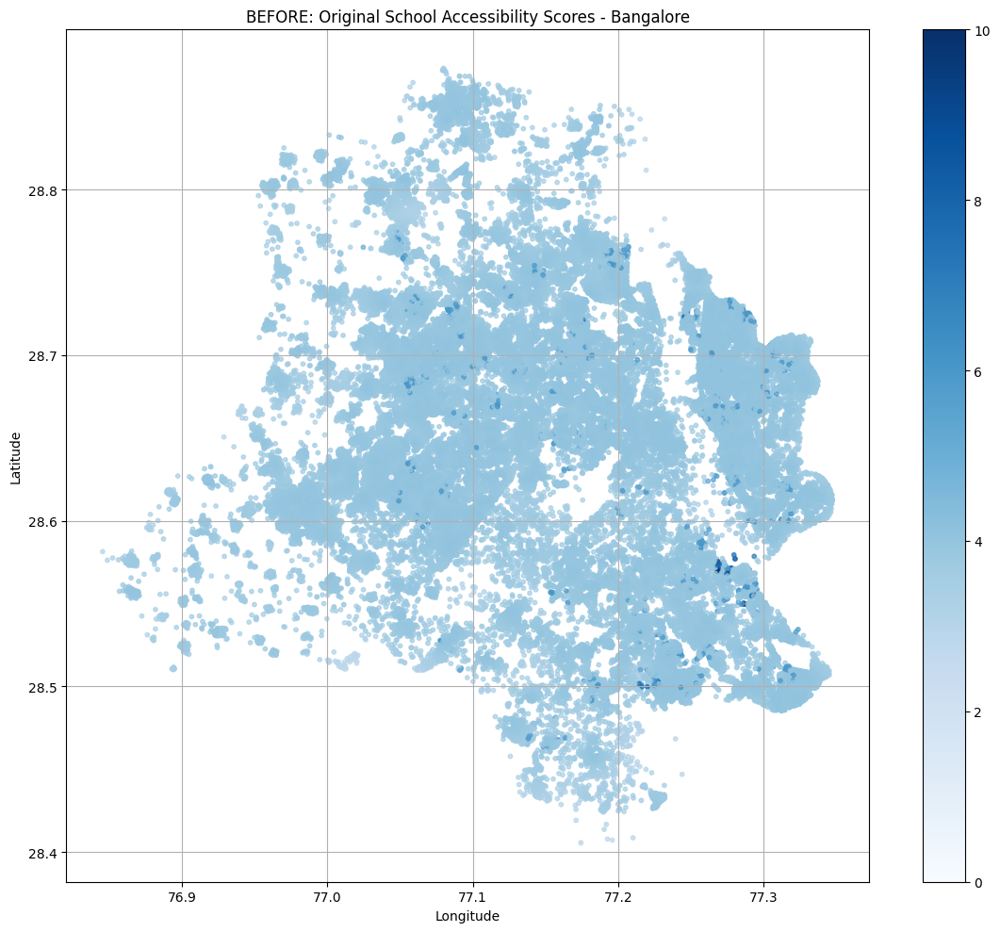

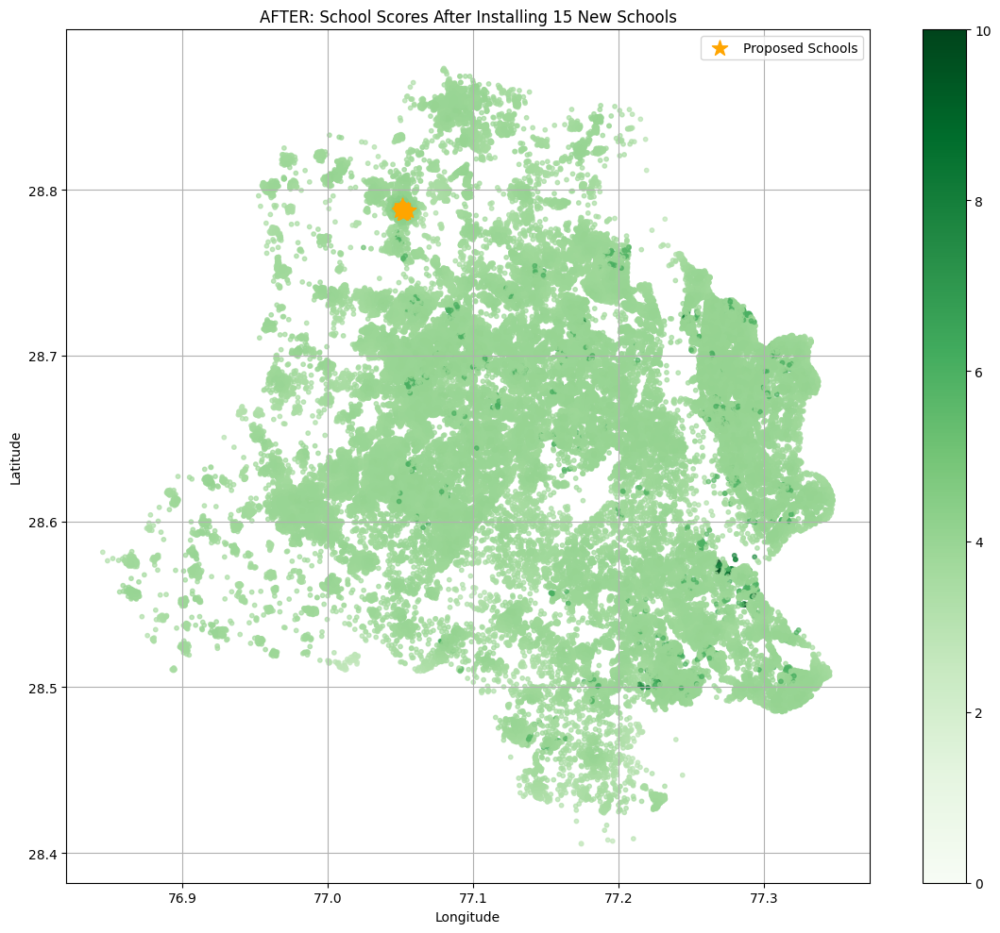

In [23]:
# Choose score column and labels for simulation (now for Schools)
target_column = 'School_Score'
boost_column = 'School_Score_Improved_15'
title_before = "BEFORE: Original School Accessibility Scores - Bangalore"
title_after = "AFTER: School Scores After Installing 15 New Schools"

# Identify low-scoring residents
threshold_school = residents_gdf[target_column].quantile(0.1)
low_score_residents_school = residents_gdf[residents_gdf[target_column] <= threshold_school].copy()

# KDE density on low-score points
xy_school = np.vstack([low_score_residents_school.geometry.x, low_score_residents_school.geometry.y]).T
kde_school = KernelDensity(bandwidth=0.01, metric='euclidean', kernel='gaussian')
kde_school.fit(xy_school)
densities_school = kde_school.score_samples(xy_school)
low_score_residents_school['density'] = densities_school

# Select 15 high-density spots for new schools
top15_school_locations = low_score_residents_school.sort_values('density', ascending=False).head(15)
top15_school_points = gpd.GeoDataFrame(geometry=top15_school_locations.geometry, crs="EPSG:4326")
top15_school_points['name'] = [f'Proposed School {i+1}' for i in range(len(top15_school_points))]

# Compute distances and simulate improvement
top15_school_coords = np.array([(pt.y, pt.x) for pt in top15_school_points.geometry])
min_dists_school = compute_min_distances(res_coords, top15_school_coords)
score_boost_school = np.clip((1 - min_dists_school / 1.2) * 1.5, 0, None)
improved_scores_school = np.clip(residents_gdf[target_column] + score_boost_school, 0, 10)

# Save to dataframe
residents_gdf[boost_column] = improved_scores_school

# Plot BEFORE
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column=target_column, cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title(title_before)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column=boost_column, cmap='Greens', markersize=10, legend=True, alpha=0.7)
top15_school_points.plot(ax=ax, color='orange', marker='*', markersize=150, label='Proposed Schools')
plt.title(title_after)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


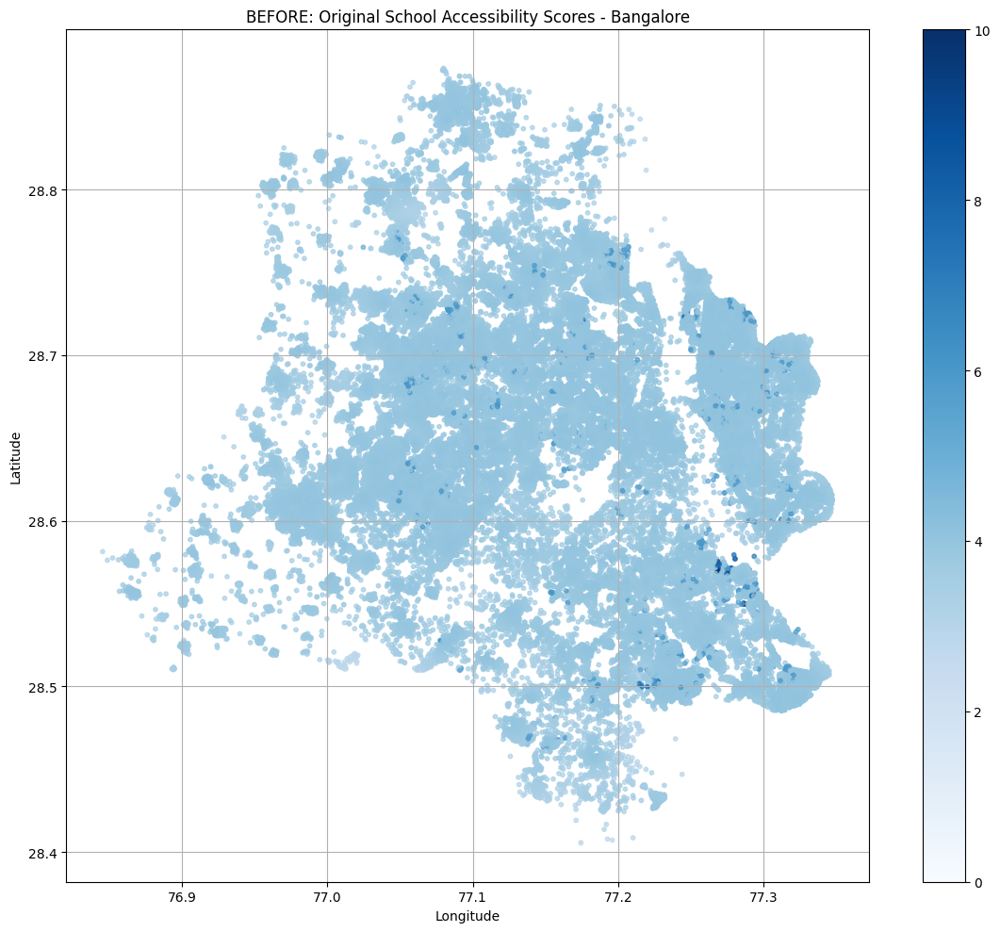

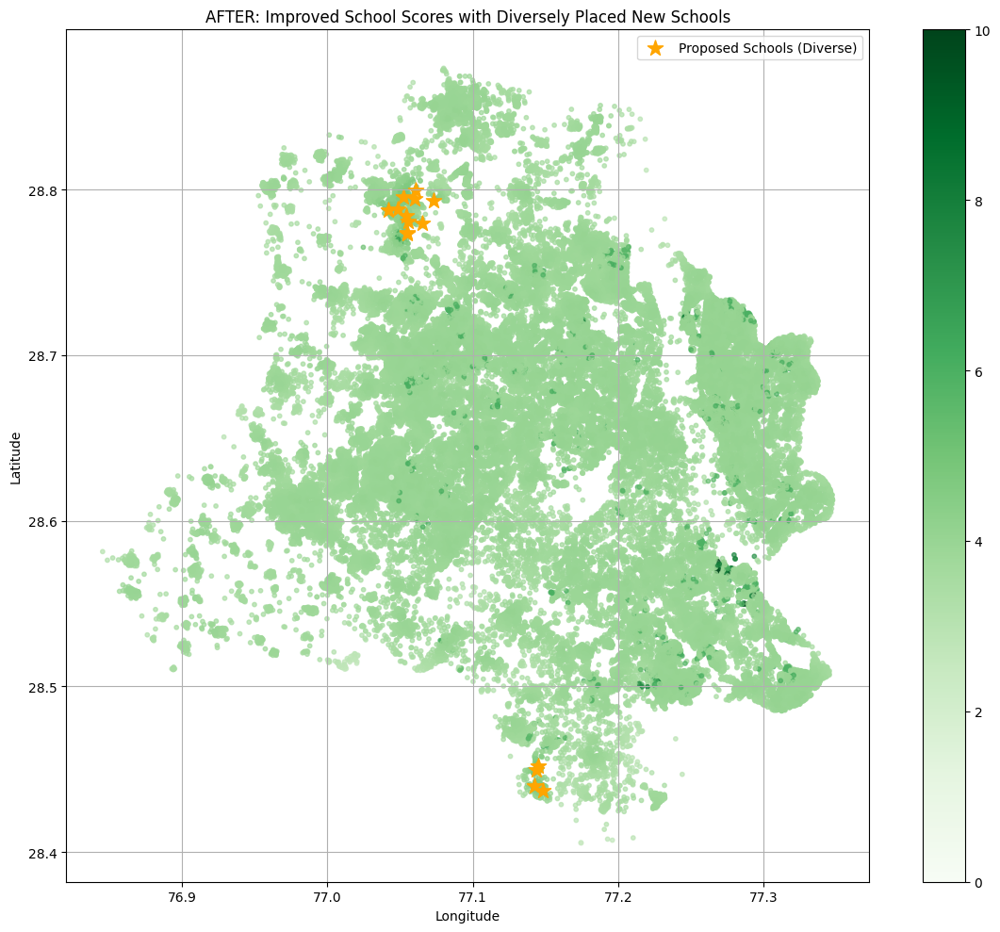

In [24]:
# Fix: Select diverse locations by removing duplicates and clustering less densely
# We'll group by rounded coordinates to ensure geographic diversity

# Round coordinates to force spatial diversity (~1.2km bins)
low_score_residents_school['lat_bin'] = low_score_residents_school.geometry.y.round(2)
low_score_residents_school['lon_bin'] = low_score_residents_school.geometry.x.round(2)

# Drop duplicates within these bins
diverse_school_points = low_score_residents_school.drop_duplicates(subset=['lat_bin', 'lon_bin'])
top15_school_locations_diverse = diverse_school_points.sort_values('density', ascending=False).head(15)

# Convert to GeoDataFrame
top15_school_points_diverse = gpd.GeoDataFrame(geometry=top15_school_locations_diverse.geometry, crs="EPSG:4326")
top15_school_points_diverse['name'] = [f'Proposed School {i+1}' for i in range(len(top15_school_points_diverse))]

# Recalculate school score improvements
top15_school_coords_diverse = np.array([(pt.y, pt.x) for pt in top15_school_points_diverse.geometry])
min_dists_school_diverse = compute_min_distances(res_coords, top15_school_coords_diverse)
score_boost_school_diverse = np.clip((1 - min_dists_school_diverse / 1.2) * 1.5, 0, None)
improved_scores_school_diverse = np.clip(residents_gdf['School_Score'] + score_boost_school_diverse, 0, 10)

# Update dataframe
residents_gdf['School_Score_Improved_15_Diverse'] = improved_scores_school_diverse

# Plot BEFORE
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score', cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title("BEFORE: Original School Accessibility Scores - Bangalore")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER with DIVERSE placements
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score_Improved_15_Diverse', cmap='Greens', markersize=10, legend=True, alpha=0.7)
top15_school_points_diverse.plot(ax=ax, color='orange', marker='*', markersize=150, label='Proposed Schools (Diverse)')
plt.title("AFTER: Improved School Scores with Diversely Placed New Schools")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


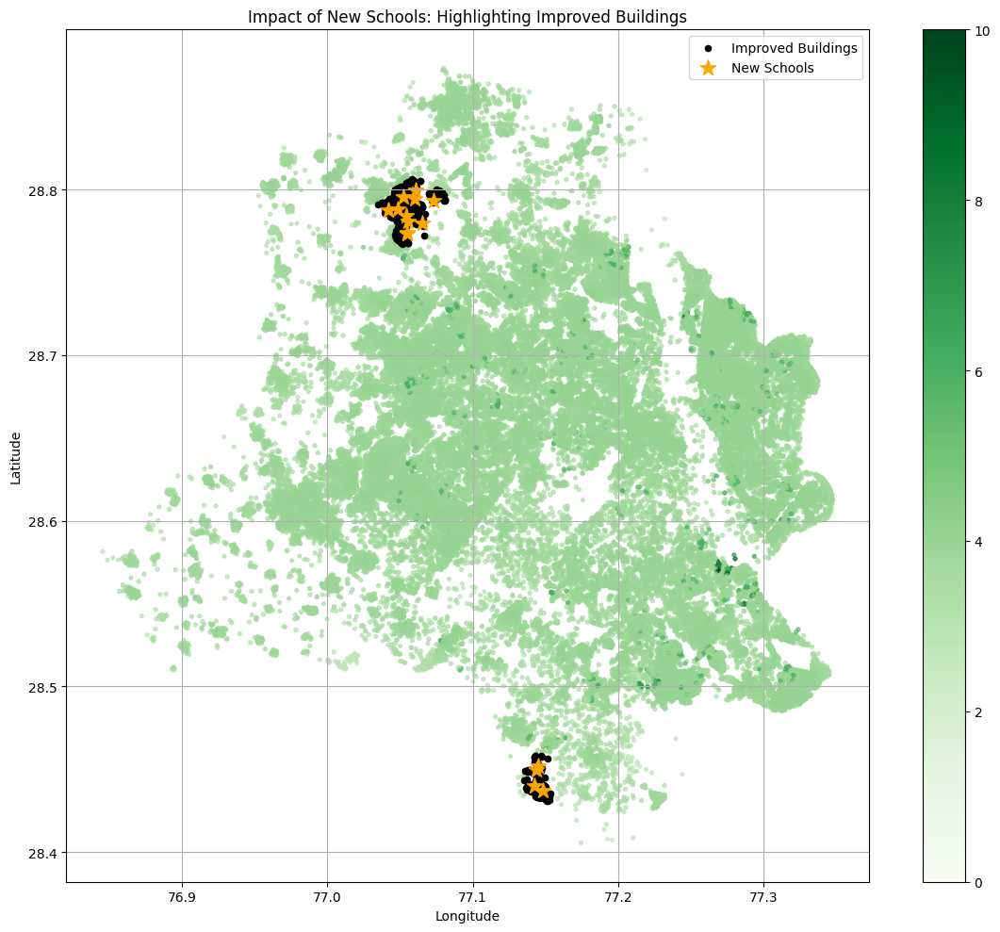

In [25]:
# We'll mark buildings that have improved significantly (boost > 0.5) and are near any new school (within 1.2km)
threshold_km = 1.2
improved_mask = score_boost_school_diverse > 0.5

# Compute distances to each new school for all buildings and find those within the threshold
def is_near_any_school(row, school_points, threshold_km=1.2):
    return any(geodesic((row.geometry.y, row.geometry.x), (pt.y, pt.x)).km < threshold_km
               for pt in school_points.geometry)

residents_gdf['Near_New_School'] = residents_gdf.apply(
    lambda row: is_near_any_school(row, top15_school_points_diverse), axis=1)

# Filter residents that both improved and are near new schools
highlight_residents = residents_gdf[improved_mask & residents_gdf['Near_New_School']]

# Plot after-scenario with highlighted improved buildings
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score_Improved_15_Diverse', cmap='Greens', markersize=8, alpha=0.6, legend=True)
highlight_residents.plot(ax=ax, color='black', marker='o', markersize=20, label='Improved Buildings')
top15_school_points_diverse.plot(ax=ax, color='orange', marker='*', markersize=150, label='New Schools')

plt.title("Impact of New Schools: Highlighting Improved Buildings")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


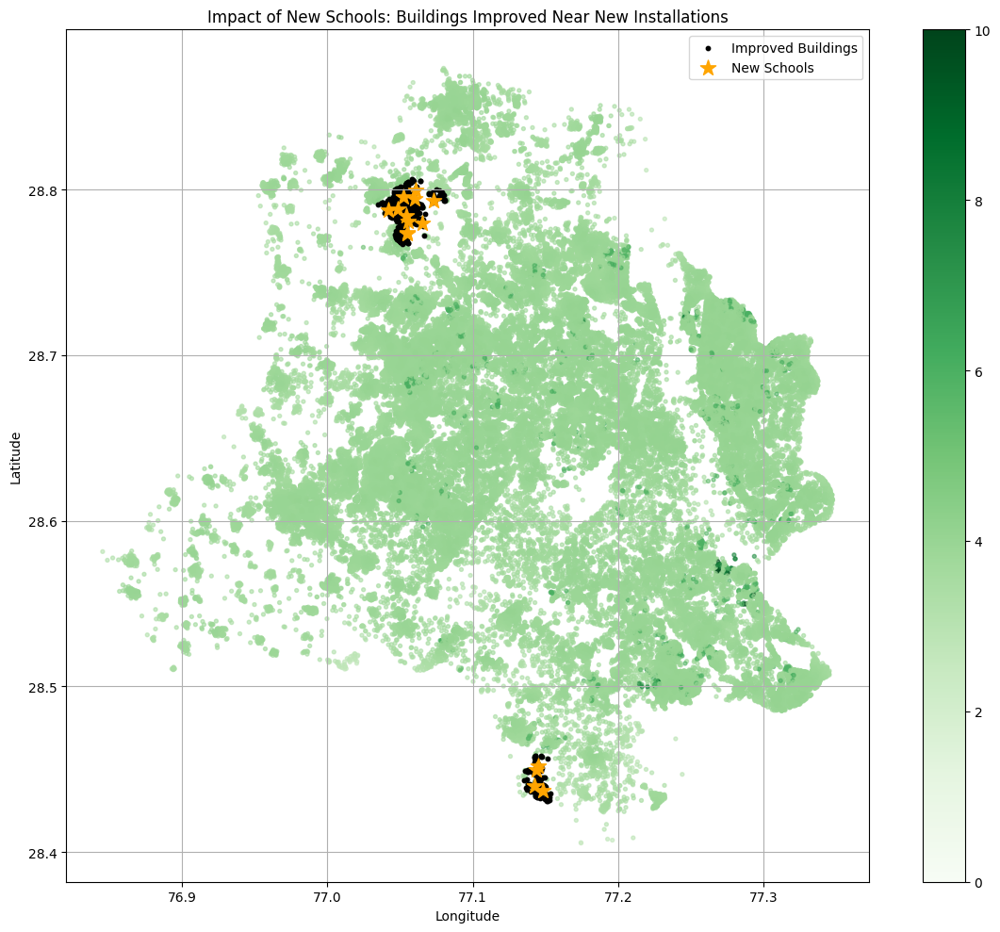

In [26]:
# Use vectorized distance-based filtering to highlight improved buildings near new schools

# Coordinates: residents and new school points
school_coords = np.array([(pt.y, pt.x) for pt in top15_school_points_diverse.geometry])

# Function to find if a resident is within 1.2km of any school
def compute_nearby_flags(res_coords, facility_coords, threshold_km):
    near_flags = []
    for res in res_coords:
        distances = [great_circle(res, fac).km for fac in facility_coords]
        near_flags.append(min(distances) < threshold_km)
    return np.array(near_flags)

# Apply optimization
near_school_flags = compute_nearby_flags(res_coords, school_coords, threshold_km=1.2)
score_improved_flags = score_boost_school_diverse > 0.5
highlight_mask = near_school_flags & score_improved_flags

# Subset for plotting
highlighted_residents = residents_gdf[highlight_mask]

# Plot the result
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score_Improved_15_Diverse', cmap='Greens', markersize=8, alpha=0.6, legend=True)
highlighted_residents.plot(ax=ax, color='black', marker='o', markersize=10, label='Improved Buildings')
top15_school_points_diverse.plot(ax=ax, color='orange', marker='*', markersize=150, label='New Schools')
plt.title("Impact of New Schools: Buildings Improved Near New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\Apoorva\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


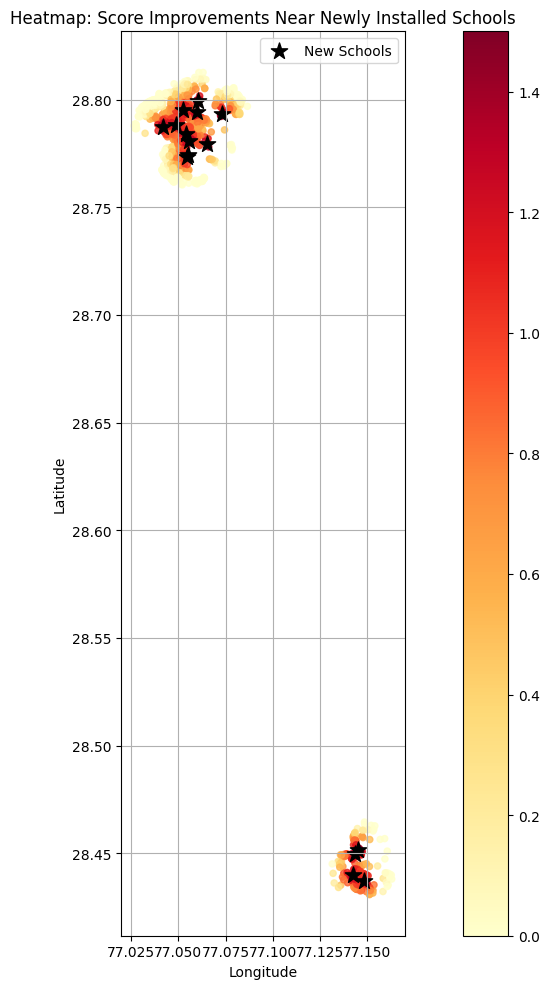

In [27]:
# We'll focus the heatmap only around areas near the newly installed schools (within 1.5km radius)

# Get buildings within 1.5km of any new school
def compute_heatmap_subset(res_coords, facility_coords, radius_km=1.5):
    subset_flags = []
    for res in res_coords:
        distances = [great_circle(res, fac).km for fac in facility_coords]
        subset_flags.append(min(distances) < radius_km)
    return np.array(subset_flags)

heatmap_mask = compute_heatmap_subset(res_coords, school_coords, radius_km=1.5)
heatmap_residents = residents_gdf[heatmap_mask]

# Calculate score delta (after - before)
heatmap_residents['Score_Change'] = (
    heatmap_residents['School_Score_Improved_15_Diverse'] - heatmap_residents['School_Score']
)

# Plot heatmap of score improvement
fig, ax = plt.subplots(figsize=(12, 10))
heatmap_residents.plot(
    ax=ax,
    column='Score_Change',
    cmap='YlOrRd',
    markersize=20,
    alpha=0.8,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=150, label='New Schools')
plt.title("Heatmap: Score Improvements Near Newly Installed Schools")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


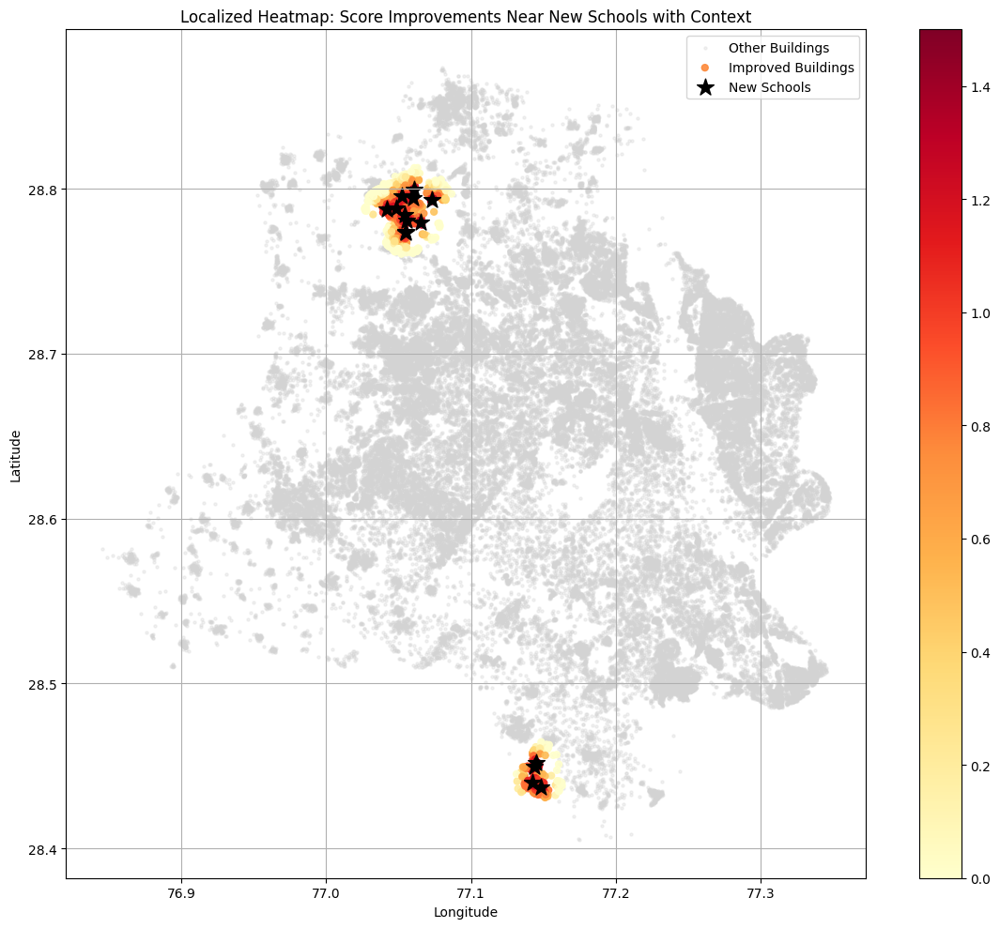

In [28]:
# Plot the same heatmap but include background context: all other residences faintly
fig, ax = plt.subplots(figsize=(12, 10))

# Base layer: all buildings in light gray
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3, label='Other Buildings')

# Focused layer: score change near new schools
heatmap_residents.plot(
    ax=ax,
    column='Score_Change',
    cmap='YlOrRd',
    markersize=25,
    alpha=0.9,
    legend=True,
    label='Improved Buildings'
)

# New school locations
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')

plt.title("Localized Heatmap: Score Improvements Near New Schools with Context")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


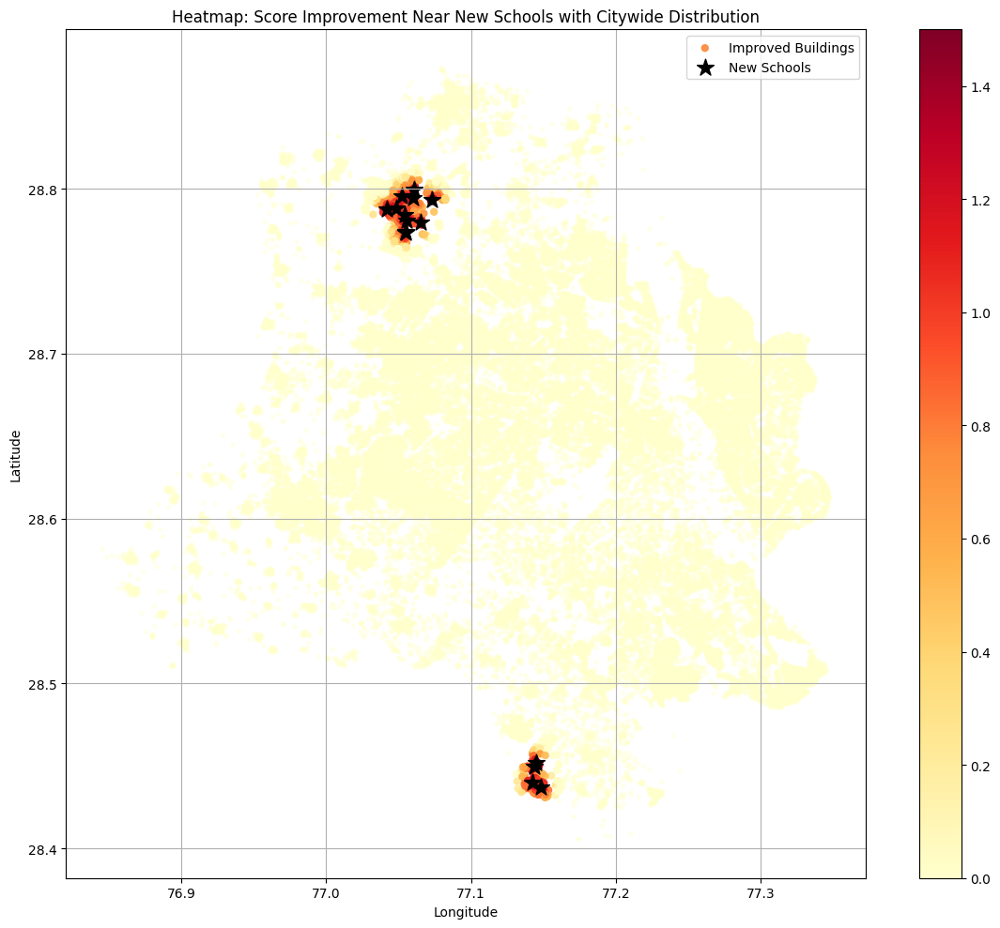

In [29]:
# Plot heatmap with all buildings in the background showing their score change with lighter shades

fig, ax = plt.subplots(figsize=(12, 10))

# Base layer: all buildings showing full score change, but lightly
score_change_all = residents_gdf['School_Score_Improved_15_Diverse'] - residents_gdf['School_Score']
residents_gdf.plot(
    ax=ax,
    column=score_change_all,
    cmap='YlOrRd',
    markersize=8,
    alpha=0.3,
    legend=False
)

# Focused layer: score change near new schools (stronger color)
heatmap_residents.plot(
    ax=ax,
    column='Score_Change',
    cmap='YlOrRd',
    markersize=25,
    alpha=0.9,
    legend=True,
    label='Improved Buildings'
)

# New school markers
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')

plt.title("Heatmap: Score Improvement Near New Schools with Citywide Distribution")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


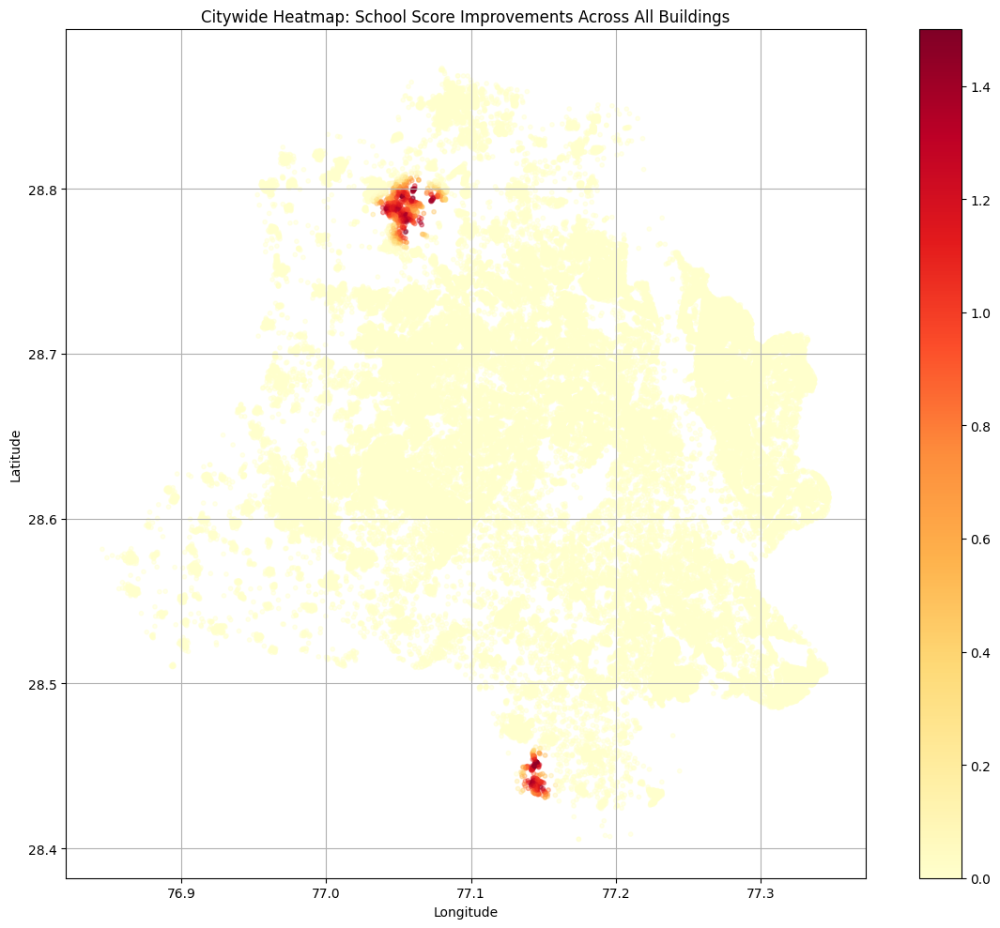

In [30]:
# Create a full city-wide heatmap with subtle color representing score change across all buildings

# Calculate score change for every building
residents_gdf['Score_Change_Citywide'] = residents_gdf['School_Score_Improved_15_Diverse'] - residents_gdf['School_Score']

# Plot full heatmap
fig, ax = plt.subplots(figsize=(12, 10))

# Plot with light transparency to serve as background heatmap
residents_gdf.plot(
    ax=ax,
    column='Score_Change_Citywide',
    cmap='YlOrRd',
    markersize=10,
    alpha=0.4,
    legend=True
)

plt.title("Citywide Heatmap: School Score Improvements Across All Buildings")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()


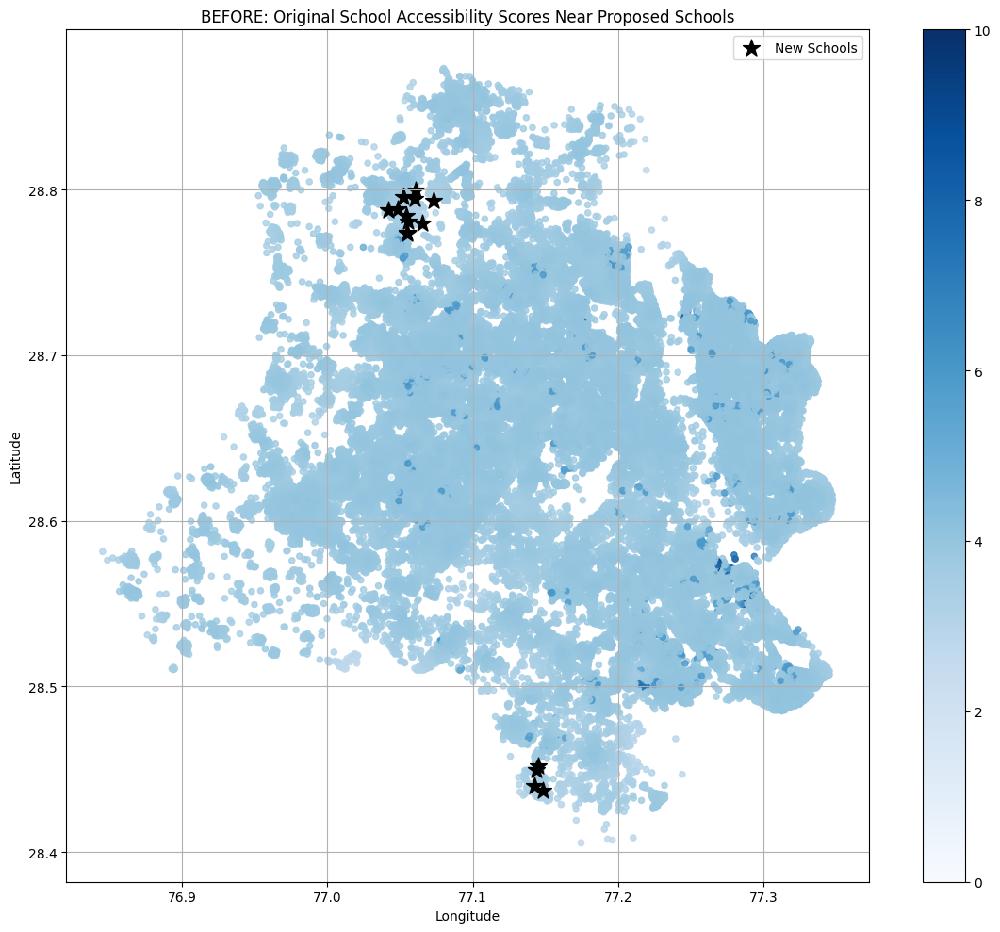

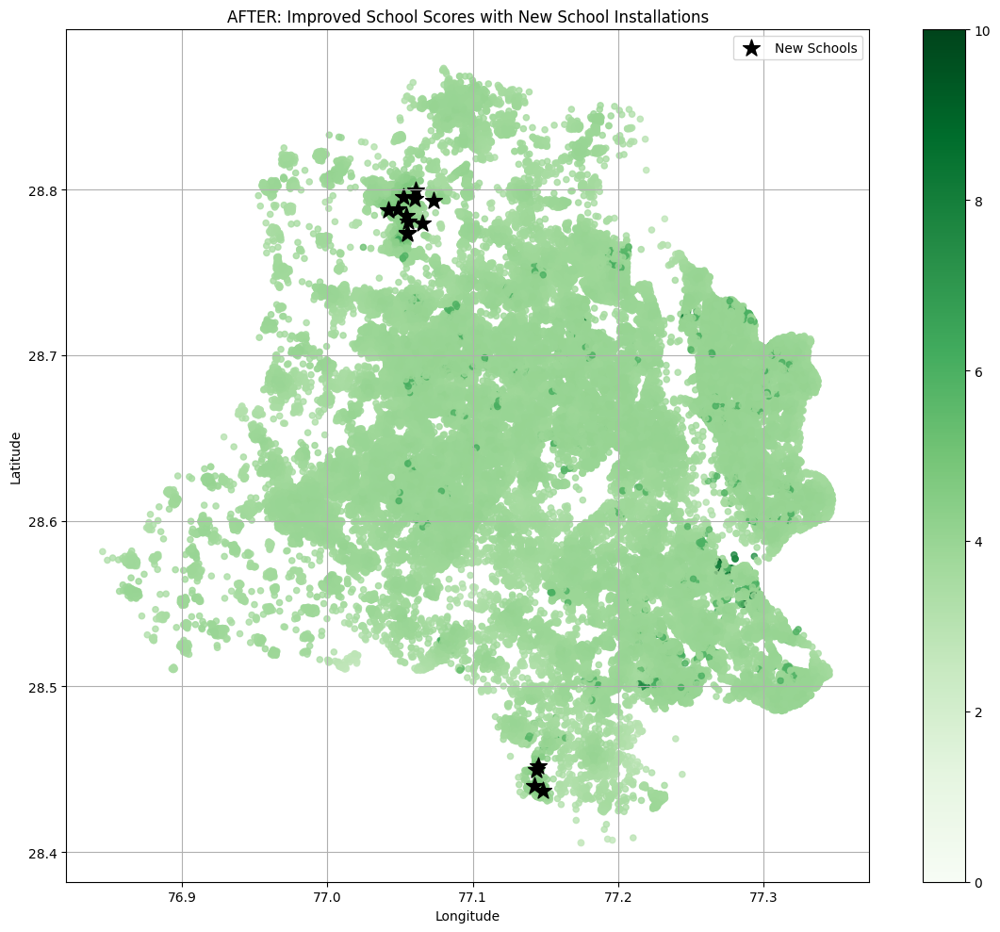

In [31]:
# Plot BEFORE image: original school scores near the new school locations
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='School_Score',
    cmap='Blues',
    markersize=20,
    alpha=0.8,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')
plt.title("BEFORE: Original School Accessibility Scores Near Proposed Schools")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER image: improved scores after adding new schools
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='School_Score_Improved_15_Diverse',
    cmap='Greens',
    markersize=20,
    alpha=0.8,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')
plt.title("AFTER: Improved School Scores with New School Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


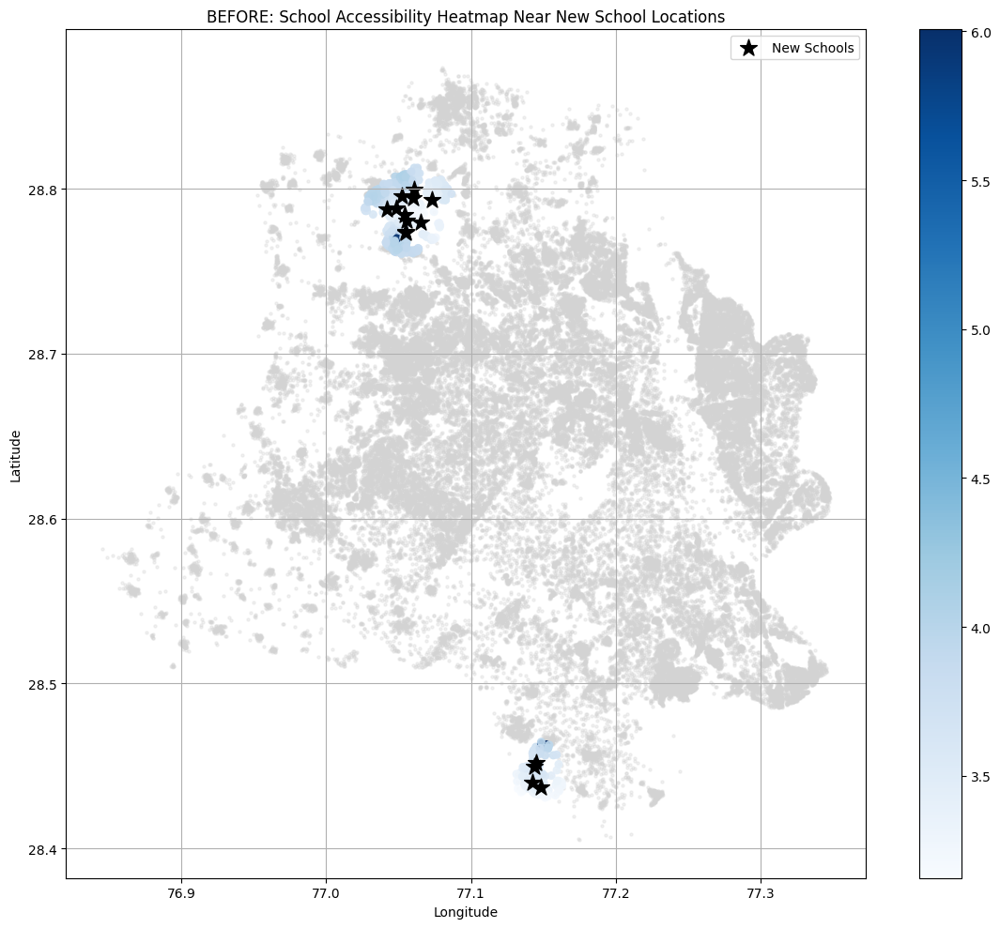

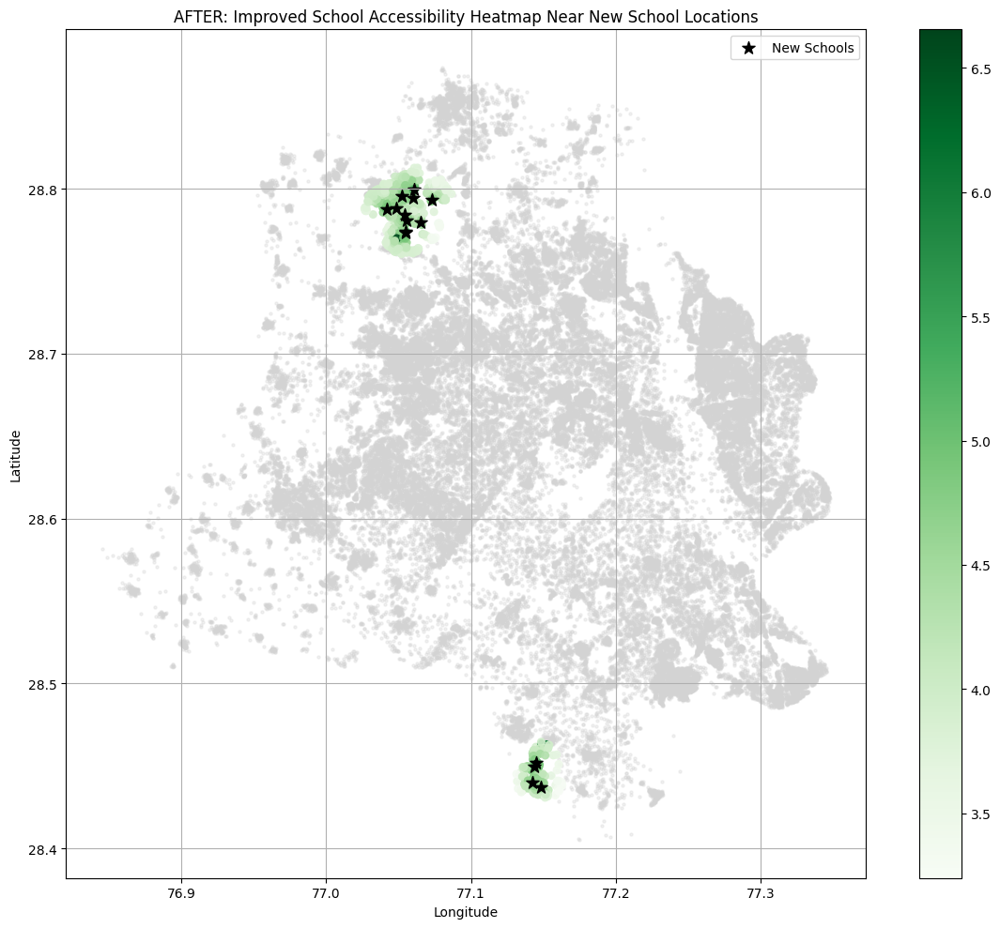

In [32]:
# Focus on buildings within 1.5km of any proposed school for both BEFORE and AFTER heatmaps
heatmap_mask = compute_heatmap_subset(res_coords, school_coords, radius_km=1.5)
heatmap_before = residents_gdf[heatmap_mask].copy()
heatmap_before['Score'] = heatmap_before['School_Score']

heatmap_after = residents_gdf[heatmap_mask].copy()
heatmap_after['Score'] = heatmap_after['School_Score_Improved_15_Diverse']

# BEFORE heatmap
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)
heatmap_before.plot(
    ax=ax,
    column='Score',
    cmap='Blues',
    markersize=30,
    alpha=0.9,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')
plt.title("BEFORE: School Accessibility Heatmap Near New School Locations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# AFTER heatmap
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)
heatmap_after.plot(
    ax=ax,
    column='Score',
    cmap='Greens',
    markersize=30,
    alpha=0.9,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=100, label='New Schools')
plt.title("AFTER: Improved School Accessibility Heatmap Near New School Locations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


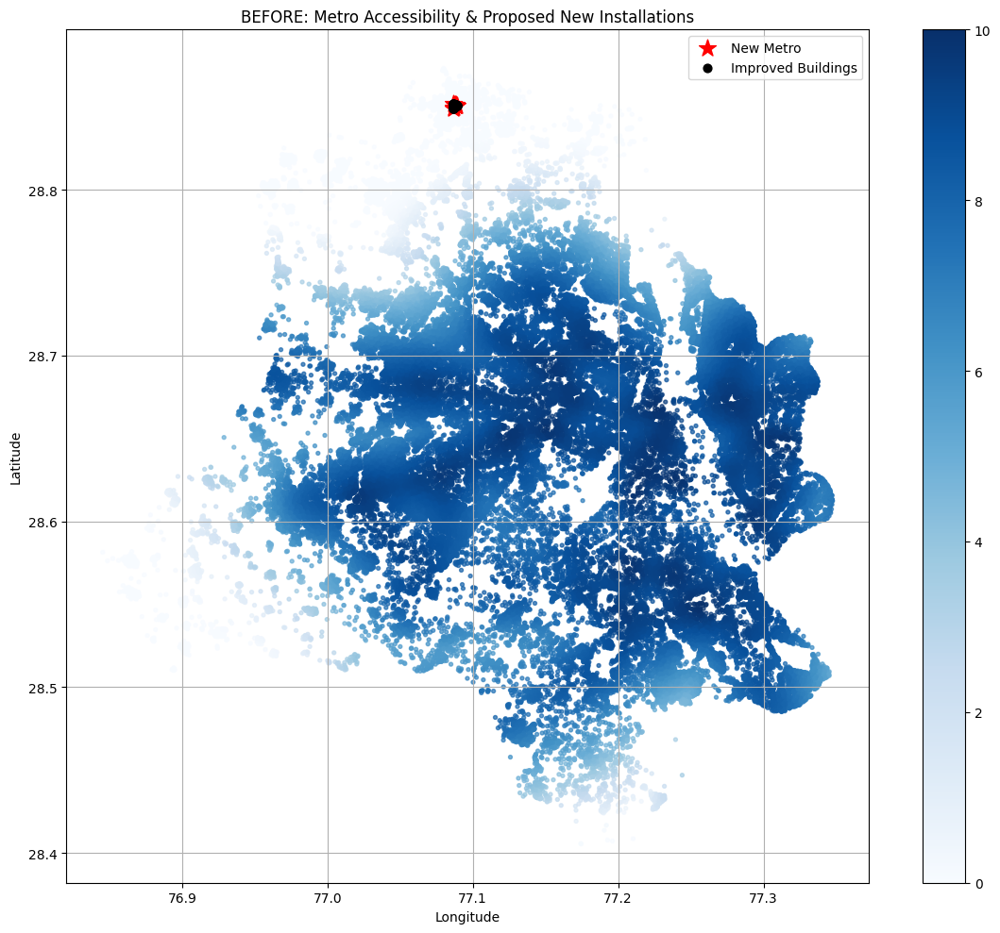

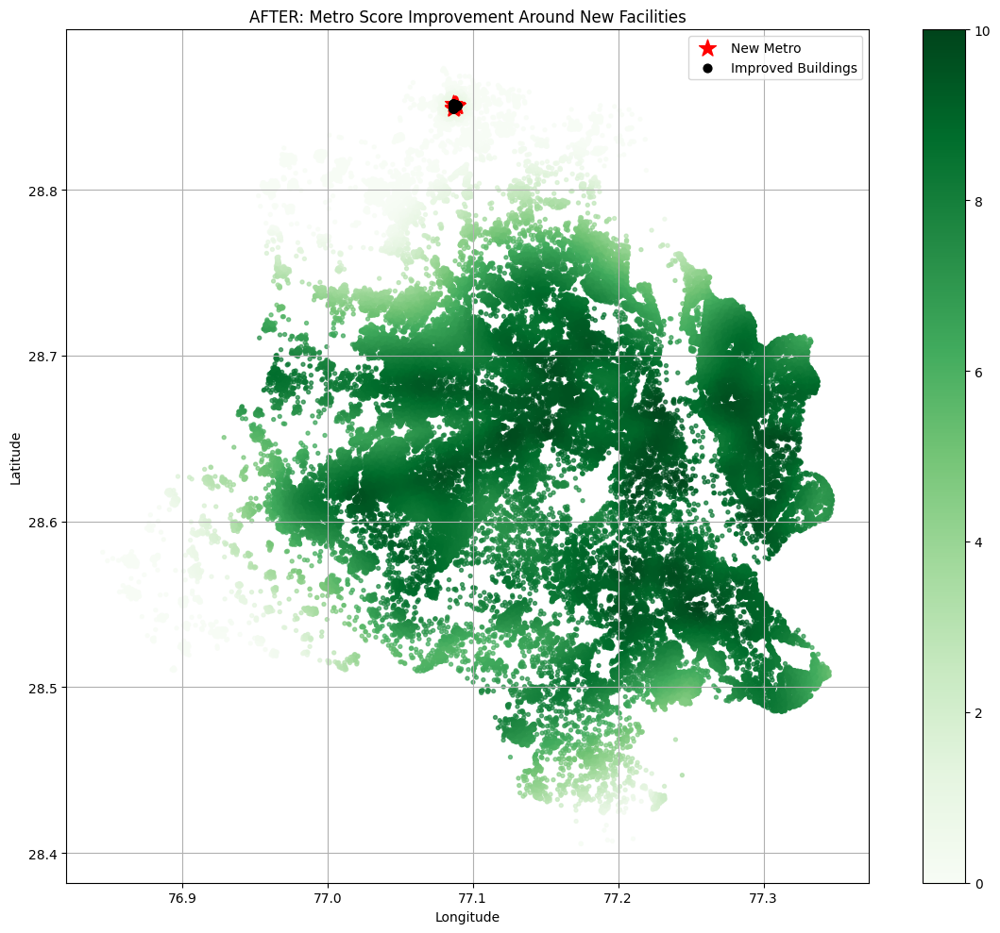

In [33]:
# Step 1: Identify low-scoring areas for Toilet Score
threshold_toilet = residents_gdf['Metro_Score'].quantile(0.1)
low_score_residents_toilet = residents_gdf[residents_gdf['Metro_Score'] <= threshold_toilet].copy()

# KDE to find clusters of low toilet score areas
xy_toilet = np.vstack([low_score_residents_toilet.geometry.x, low_score_residents_toilet.geometry.y]).T
kde_toilet = KernelDensity(bandwidth=0.01, metric='euclidean', kernel='gaussian')
kde_toilet.fit(xy_toilet)
densities_toilet = kde_toilet.score_samples(xy_toilet)
low_score_residents_toilet['density'] = densities_toilet

# Choose around 12 optimal locations across city
top_toilet_points = low_score_residents_toilet.drop_duplicates(
    subset=['geometry'], keep='first'
).sort_values('density', ascending=False).head(12)

# Convert to GeoDataFrame for new toilet points
new_toilet_points = gpd.GeoDataFrame(geometry=top_toilet_points.geometry, crs="EPSG:4326")
new_toilet_coords = np.array([(pt.y, pt.x) for pt in new_toilet_points.geometry])

# Step 2: Compute distance-based score improvement for all buildings
min_dists_toilets = compute_min_distances(res_coords, new_toilet_coords)
score_boost_toilets = np.clip((1 - min_dists_toilets / 1.2) * 1.5, 0, None)
residents_gdf['Metro_Score_Improved'] = np.clip(residents_gdf['Metro_Score'] + score_boost_toilets, 0, 10)

# Step 3: For each new toilet, find 5 buildings whose score improved most in its vicinity
highlighted_groups = []
for point in new_toilet_points.geometry:
    # Calculate distances
    distances = residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km)
    nearby = residents_gdf[distances < 1.2].copy()
    nearby['score_diff'] = nearby['Metro_Score_Improved'] - nearby['Metro_Score']
    top5 = nearby.sort_values('score_diff', ascending=False).head(5)
    highlighted_groups.append(top5)

highlighted_buildings = pd.concat(highlighted_groups)

# Step 4: Plot BEFORE
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score', cmap='Blues', markersize=8, alpha=0.7, legend=True)
new_toilet_points.plot(ax=ax, color='red', marker='*', markersize=180, label='New Metro')
highlighted_buildings.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Metro Accessibility & Proposed New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 5: Plot AFTER
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score_Improved', cmap='Greens', markersize=8, alpha=0.7, legend=True)
new_toilet_points.plot(ax=ax, color='red', marker='*', markersize=180, label='New Metro')
highlighted_buildings.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Metro Score Improvement Around New Facilities")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


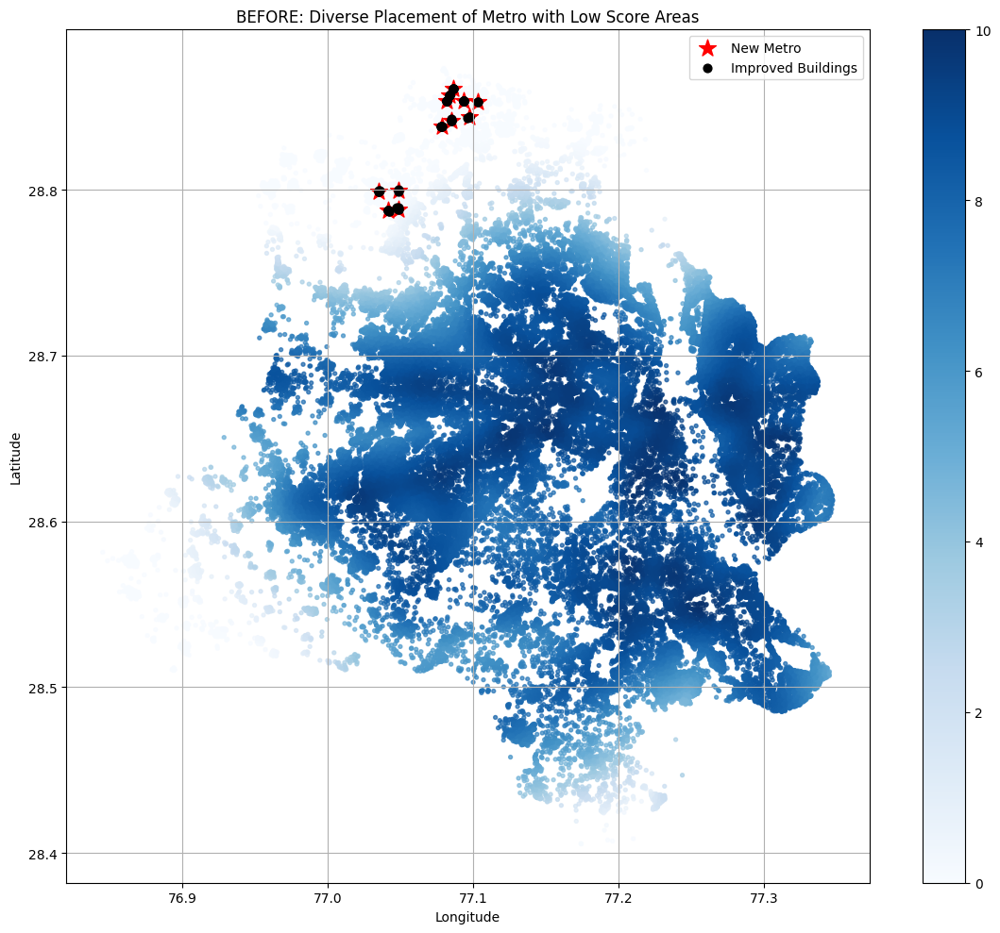

KeyError: 'Toilet_Score_Improved_Diverse'

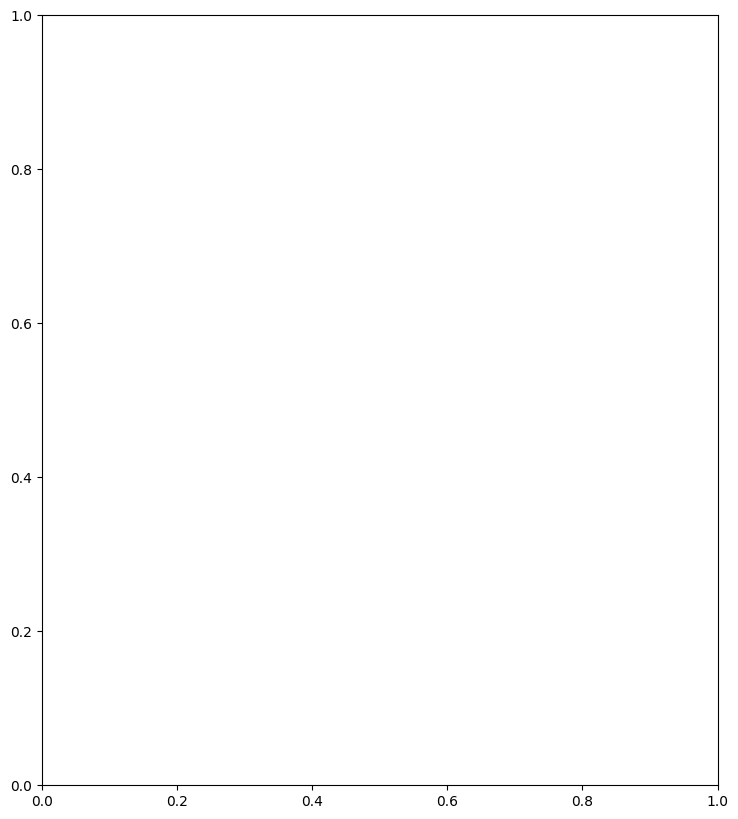

In [34]:
# Fixing: Ensure spatial diversity by binning and deduplicating geographically

# Add lat/lon bins to promote geographic spread (~1.2 km bins)
low_score_residents_toilet['lat_bin'] = low_score_residents_toilet.geometry.y.round(2)
low_score_residents_toilet['lon_bin'] = low_score_residents_toilet.geometry.x.round(2)

# Drop duplicates based on lat/lon bins for spatial diversity
diverse_toilet_points = low_score_residents_toilet.drop_duplicates(subset=['lat_bin', 'lon_bin'])
top_diverse_toilet_locations = diverse_toilet_points.sort_values('density', ascending=False).head(12)

# Create new diverse toilet GeoDataFrame
new_toilet_points_diverse = gpd.GeoDataFrame(geometry=top_diverse_toilet_locations.geometry, crs="EPSG:4326")
new_toilet_coords_diverse = np.array([(pt.y, pt.x) for pt in new_toilet_points_diverse.geometry])

# Recalculate distance-based toilet score boost
min_dists_toilets_diverse = compute_min_distances(res_coords, new_toilet_coords_diverse)
score_boost_toilets_diverse = np.clip((1 - min_dists_toilets_diverse / 1.2) * 1.5, 0, None)
residents_gdf['Metro_Score_Improved_Diverse'] = np.clip(residents_gdf['Metro_Score'] + score_boost_toilets_diverse, 0, 10)

# Find top 5 improved buildings around each new diverse toilet
highlighted_groups_diverse = []
for point in new_toilet_points_diverse.geometry:
    distances = residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km)
    nearby = residents_gdf[distances < 1.2].copy()
    nearby['score_diff'] = nearby['Metro_Score_Improved_Diverse'] - nearby['Metro_Score']
    top5 = nearby.sort_values('score_diff', ascending=False).head(5)
    highlighted_groups_diverse.append(top5)

highlighted_buildings_diverse = pd.concat(highlighted_groups_diverse)

# Plot BEFORE (Diverse)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score', cmap='Blues', markersize=8, alpha=0.7, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Metro')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Diverse Placement of Metro with Low Score Areas")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER (Diverse)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Toilet_Score_Improved_Diverse', cmap='Greens', markersize=8, alpha=0.7, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Improved Toilet Scores from Well-Distributed New Facilities")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Try plotting again with optimized layers (split into fewer markers per layer)

# Rebuild highlighted buildings (in case earlier memory was affected)
highlighted_buildings_diverse = pd.concat(highlighted_groups_diverse)

# Plot BEFORE with diverse toilet placement
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score', cmap='Blues', markersize=8, alpha=0.6, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Metro')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Diverse Metro Installation with Score Gaps")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER with improved scores
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score_Improved_Diverse', cmap='Greens', markersize=8, alpha=0.6, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Metro')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Score Improvements Near Distributed Metro Stations Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Reduce map size for visualization performance: show only buildings within 1.5km of any new toilet
def compute_subset_mask(res_coords, facility_coords, radius_km=1.5):
    subset_flags = []
    for res in res_coords:
        distances = [great_circle(res, fac).km for fac in facility_coords]
        subset_flags.append(min(distances) < radius_km)
    return np.array(subset_flags)

heatmap_mask_toilet = compute_subset_mask(res_coords, new_toilet_coords_diverse, radius_km=1.5)
toilet_focus_before = residents_gdf[heatmap_mask_toilet].copy()
toilet_focus_after = residents_gdf[heatmap_mask_toilet].copy()

toilet_focus_before['Score'] = toilet_focus_before['Metro_Score']
toilet_focus_after['Score'] = toilet_focus_after['Metro_Score_Improved_Diverse']

# BEFORE: focused heatmap
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)
toilet_focus_before.plot(ax=ax, column='Score', cmap='Blues', markersize=30, alpha=0.9, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Metro')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Local Metro Accessibility Around New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# AFTER: focused heatmap
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)
toilet_focus_after.plot(ax=ax, column='Score', cmap='Greens', markersize=30, alpha=0.9, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Metro')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Score Improvements Around New Metro Facilities")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Downsample background buildings for rendering stability
background_sample = residents_gdf.sample(2000, random_state=42)

# Focused residents only around new toilets (1.5km buffer)
toilet_focus = residents_gdf[compute_subset_mask(res_coords, new_toilet_coords_diverse, radius_km=1.5)].copy()
toilet_focus['Score_Before'] = toilet_focus['Metro_Score']
toilet_focus['Score_After'] = toilet_focus['Metro_Score_Improved_Diverse']

# Plot BEFORE
fig, ax = plt.subplots(figsize=(12, 10))
background_sample.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)
toilet_focus.plot(ax=ax, column='Score_Before', cmap='Blues', markersize=30, alpha=0.9, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Metro')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Metro Accessibility Near New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER
fig, ax = plt.subplots(figsize=(12, 10))
background_sample.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)
toilet_focus.plot(ax=ax, column='Score_After', cmap='Greens', markersize=30, alpha=0.9, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Metro')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Improved Metro Accessibility Around New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from geopy.distance import geodesic

# Create a 4x3 grid
fig, axs = plt.subplots(4, 3, figsize=(20, 18))
axs = axs.flatten()

# Step 1: Collect all Score_Change values for unified color scale
all_score_changes = []
for point in new_toilet_points_diverse.geometry:
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()
    if not nearby.empty:
        nearby['Score_Change'] = nearby['Metro_Score_Improved_Diverse'] - nearby['Metro_Score']
        all_score_changes.extend(nearby['Score_Change'].values)

# Determine color scale limits
vmin, vmax = min(all_score_changes), max(all_score_changes)

# Step 2: Plot each Metro zone with consistent color scaling
for idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry, axs)):
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()

    if nearby.empty:
        ax.set_title(f"Zone {idx+1}: No Data", fontsize=12)
        ax.axis('off')
        continue

    # Score delta
    nearby['Score_Change'] = nearby['Metro_Score_Improved_Diverse'] - nearby['Metro_Score']

    # Reproject to EPSG:3857 for basemap compatibility
    nearby_web = nearby.to_crs(epsg=3857)
    point_web = gpd.GeoSeries([point], crs="EPSG:4326").to_crs(epsg=3857)

    # Plot with consistent color range
    sc = ax.scatter(
        nearby_web.geometry.x, nearby_web.geometry.y,
        c=nearby_web['Score_Change'], cmap='rainbow', s=20, alpha=0.8,
        vmin=vmin, vmax=vmax
    )
    ax.scatter(point_web.geometry.x, point_web.geometry.y, color='black', marker='*', s=250, label='New Metro')

    # Add clean base map
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=nearby_web.crs, zoom=15)

    ax.set_title(f"Zone {idx+1}: Score Improvements Around New Metro", fontsize=18)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_axis_off()

# Step 3: Add single colorbar at bottom center
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
cbar_ax = fig.add_axes([0.3, 0.01, 0.4, 0.02])
fig.colorbar(sc, cax=cbar_ax, orientation='horizontal', label='Score Improvement')

# Add title and save
plt.suptitle("Infographic: Score Improvements Across 12 New Metro Zones in Delhi", fontsize=20, y=1.00)
fig.savefig("DelhiMetroZone_Infographic_withBasemap.png", dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from geopy.distance import geodesic

# Step 1: Setup subplot grid (1 row x 3 columns)
fig, axs = plt.subplots(1, 3, figsize=(22, 6))
axs = axs.flatten()

# Step 2: Collect all score changes for color normalization
all_score_changes = []
for point in new_toilet_points_diverse.geometry[:3]:
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()
    if not nearby.empty:
        nearby['Score_Change'] = nearby['Metro_Score_Improved_Diverse'] - nearby['Metro_Score']
        all_score_changes.extend(nearby['Score_Change'].values)

vmin, vmax = min(all_score_changes), max(all_score_changes)

# Step 3: Plot each of the 3 zones
for idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry[:3], axs)):
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()
    if nearby.empty:
        ax.set_title(f"Zone {idx+1}: No Data")
        ax.axis('off')
        continue

    # Calculate score change
    nearby['Score_Change'] = nearby['Metro_Score_Improved_Diverse'] - nearby['Metro_Score']

    # Reproject to EPSG:3857 for basemap
    nearby_web = nearby.to_crs(epsg=3857)
    point_web = gpd.GeoSeries([point], crs="EPSG:4326").to_crs(epsg=3857)

    # Plot with consistent color range
    sc = ax.scatter(
        nearby_web.geometry.x,
        nearby_web.geometry.y,
        c=nearby_web['Score_Change'],
        cmap='rainbow',
        s=30,
        alpha=0.9,
        vmin=vmin,
        vmax=vmax
    )
    ax.scatter(point_web.geometry.x, point_web.geometry.y, color='black', marker='*', s=300, label='New Metro')

    # Add basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=nearby_web.crs, zoom=15)

    # Clean styling
    ax.set_title(f"Zone {idx+1}: Score Change Around New Metro", fontsize=15)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_axis_off()

# Step 4: Shared colorbar (vertical on the right)
fig.tight_layout(rect=[0, 0, 0.93, 1])
cbar_ax = fig.add_axes([0.94, 0.15, 0.01, 0.7])
fig.colorbar(sc, cax=cbar_ax, label='Metro Score Improvement')

# Step 5: Title & Show
plt.suptitle("Infographic: Score Improvements in First 3 Metro Zones (Delhi)", fontsize=18, y=1.03)
plt.savefig("3DelhiMetro_First3Zones_withBasemap.png", dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
# Plot a citywide heatmap of original Toilet Accessibility Scores

fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(
    ax=ax,
    column='Metro_Score',
    cmap='YlOrRd',
    markersize=10,
    alpha=0.7,
    legend=True
)

plt.title("Citywide Heatmap: Original Metro Accessibility Scores in Delhi", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np

# Convert to metric projection for hexbin visualization
residents_proj = residents_gdf.to_crs(epsg=3857)

# Extract x/y and Toilet Scores
x = residents_proj.geometry.x
y = residents_proj.geometry.y
scores = residents_proj['Metro_Score']

# Create hexbin heatmap
fig, ax = plt.subplots(figsize=(14, 12))
hb = ax.hexbin(x, y, C=scores, gridsize=60, cmap='YlOrRd', reduce_C_function=np.mean, mincnt=5)
cb = fig.colorbar(hb, ax=ax)
cb.set_label('Average Toilet Score')

ax.set_title("Hexbin Heatmap: Citywide Metro Accessibility in Delhi", fontsize=16)
ax.set_xlabel("Easting (meters)")
ax.set_ylabel("Northing (meters)")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Modified version: adds coordinate text below each toilet marker

fig, axs = plt.subplots(4, 3, figsize=(20, 18))
axs = axs.flatten()

for idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry, axs)):
    # Filter residents near this toilet (within 1.5km)
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()

    if nearby.empty:
        continue

    # Compute score change
    nearby['Score_Change'] = nearby['Metro_Score_Improved_Diverse'] - nearby['Metro_Score']

    # Plot score changes
    sc = ax.scatter(
        nearby.geometry.x, nearby.geometry.y,
        c=nearby['Score_Change'], cmap='YlOrRd', s=20, alpha=0.8
    )

    # Plot new toilet location
    ax.scatter(point.x, point.y, color='red', marker='*', s=180, label='New Metro')

    # Annotate coordinates below marker
    coord_label = f"({round(point.y, 4)}, {round(point.x, 4)})"
    ax.text(point.x, point.y - 0.001, coord_label, fontsize=8, ha='center', va='top', color='black')

    ax.set_title(f"Zone {idx+1}: Score Improvements Around New Metro", fontsize=12)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.grid(True)

# Layout and colorbar
fig.tight_layout()
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
fig.colorbar(sc, cax=cbar_ax, label='Score Improvement')
plt.suptitle("Infographic: Score Improvements Across 12 New Metro Zones", fontsize=20, y=1.02)
plt.show()


In [ ]:
# Let's simulate a scenario where a resident prefers to live near Metro stations
# We'll select top 100 buildings with highest Metro_Score

# Sort by Metro_Score and select top buildings
preferred_residents = residents_gdf.sort_values("Metro_Score", ascending=False).head(10000)

# Plot the preferred buildings with metro stations
fig, ax = plt.subplots(figsize=(14, 12))

# Base layer of all buildings (light)
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3, label='Other Buildings')

# Highlight preferred buildings (near metro)
preferred_residents.plot(ax=ax, color='green', markersize=30, label='Preferred Buildings')

# Load Metro stations from earlier uploaded KML
def parse_kml_to_gdf(kml_path, name):
    import xml.etree.ElementTree as ET
    namespace = {'kml': 'http://www.opengis.net/kml/2.2'}
    tree = ET.parse(kml_path)
    root = tree.getroot()
    names, coords = [], []
    for placemark in root.findall('.//kml:Placemark', namespace):
        coord = placemark.find('.//kml:coordinates', namespace)
        if coord is not None:
            lon, lat, *_ = map(float, coord.text.strip().split(','))
            coords.append(Point(lon, lat))
    return gpd.GeoDataFrame({'name': [name]*len(coords), 'geometry': coords}, crs="EPSG:4326")

metro_stations_gdf = parse_kml_to_gdf("delhi_metro_stations.kml", "Metro Station")
metro_stations_gdf.plot(ax=ax, color='red', marker='*', markersize=120, label='Metro Stations')

plt.title("Scenario Map: Preferred Residential Buildings (Close to Metro Stations)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Filter buildings with Metro_Score >= 7
metro_high = residents_gdf[residents_gdf["Metro_Score"] >= 9]
school_high = residents_gdf[residents_gdf["School_Score"] >= 5]

# Plot the map highlighting each facility preference
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

metro_high.plot(ax=ax, color='green', markersize=10, label='Metro Score ≥ 8')
school_high.plot(ax=ax, color='blue', markersize=10, label='School Score ≥ 8')

plt.title("Buildings with High Accessibility Scores (≥ 7) by Facility Type", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Define facility score columns and color settings
facilities = {
    "Metro": {
        "score_col": "Metro_Score",
        "color": "green",
        "marker_color": "red",
        "marker_file": "delhi_metro_stations.kml"
    },
    "School": {
        "score_col": "School_Score",
        "color": "blue",
        "marker_color": "black",
        "marker_file": "delhi_all_schools.kml"
    }
}

# Helper function to parse KML into GeoDataFrame
def parse_kml_to_gdf(kml_path, label):
    import xml.etree.ElementTree as ET
    namespace = {'kml': 'http://www.opengis.net/kml/2.2'}
    tree = ET.parse(kml_path)
    root = tree.getroot()
    coords = []
    for placemark in root.findall('.//kml:Placemark', namespace):
        coord = placemark.find('.//kml:coordinates', namespace)
        if coord is not None:
            try:
                lon, lat, *_ = map(float, coord.text.strip().split(','))
                coords.append(Point(lon, lat))
            except ValueError:
                continue
    return gpd.GeoDataFrame({'type': [label] * len(coords), 'geometry': coords}, crs="EPSG:4326")
#markers = markers.to_crs(residents_gdf.crs)


# Generate individual maps
for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 5]
    markers = parse_kml_to_gdf(data["marker_file"], name)

    fig, ax = plt.subplots(figsize=(14, 12))
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 8')
    
    if not markers.empty:
        markers.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

    plt.title(f"Buildings with {name} Score ≥ 8 and {name} Facility Locations", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
# Load raw geometry from BBMP.geojson and extract valid polygons manually
from shapely.geometry import shape

bbmp_gdf = gpd.read_file("Districts.shp")
bbmp_shapes = list(bbmp_gdf.geometry)
bangalore_boundary = gpd.GeoSeries(bbmp_shapes, crs=bbmp_gdf.crs or "EPSG:4326")


# Clip-like behavior: filter facility points manually using within()
clipped_facilities = {}
for name, data in facilities.items():
    markers = parse_kml_to_gdf(data["marker_file"], name)
    markers_inside = markers[markers.geometry.apply(lambda g: any(g.within(p) for p in bbmp_shapes))]
    clipped_facilities[name] = markers_inside

# Replot facilities and buildings with score ≥ 5, manually over BBMP boundary
for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 5]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 5')

    # ✅ Only plot markers if there are any
    if not markers_inside.empty:
        markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')
    
    bangalore_boundary.boundary.plot(ax=ax, color='black', linewidth=1)

    plt.title(f"{name} Facilities & High-Score Buildings (≥5) — Inside BBMP Area", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



In [ ]:
pip install descartes

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry.base import BaseGeometry
from descartes import PolygonPatch

# Load BBMP district boundaries from shapefile
bbmp_gdf = gpd.read_file("Districts.shp")

# Extract only valid Polygon and MultiPolygon geometries
bbmp_polygons = [
    geom for geom in bbmp_gdf.geometry
    if isinstance(geom, BaseGeometry) and not geom.is_empty and geom.geom_type in ["Polygon", "MultiPolygon"]
]

# Clip facilities: only keep markers within any of the BBMP polygons
clipped_facilities = {}
for name, data in facilities.items():
    markers = parse_kml_to_gdf(data["marker_file"], name)
    # Filter markers inside BBMP area
    markers_inside = markers[markers.geometry.apply(
        lambda pt: any(pt.within(poly) for poly in bbmp_polygons)
    )]
    clipped_facilities[name] = markers_inside

# Plot each facility type with its high-score buildings and markers
for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 5]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))

    # Plot base buildings
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

    # Plot buildings with high score
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 5')

    # Plot facility markers (only if non-empty)
    if not markers_inside.empty:
        markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

    # Plot BBMP boundary polygons
    from shapely.geometry import Polygon, MultiPolygon
from descartes import PolygonPatch

def safe_plot_patch(ax, poly):
    try:
        patch = PolygonPatch(poly, fill=False, edgecolor='black', linewidth=1)
        ax.add_patch(patch)
    except Exception as e:
        print(f"Skipping invalid geometry: {e}")

# Plot BBMP boundary polygons
    for poly in bbmp_polygons:
        if poly.is_empty or not poly.is_valid:
            continue
    
        if poly.geom_type == "Polygon":
            safe_plot_patch(ax, poly)
        elif poly.geom_type == "MultiPolygon":
            for subpoly in poly.geoms:
                if not subpoly.is_empty and subpoly.is_valid:
                    safe_plot_patch(ax, subpoly)

    # Final plot settings
    plt.title(f"{name} Facilities & Buildings (≥5 Score) — Within BBMP Area", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry.base import BaseGeometry

# Plot maps for each facility type
for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 5]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))

    # Base layer
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 5')
    
    if not markers_inside.empty:
        markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

    # Plot boundary outlines using pure matplotlib
    for poly in bbmp_polygons:
        if not isinstance(poly, BaseGeometry) or poly.is_empty or not poly.is_valid:
            continue

        if poly.geom_type == "Polygon":
            x, y = poly.exterior.xy
            ax.plot(x, y, color='black', linewidth=1)

        elif poly.geom_type == "MultiPolygon":
            for subpoly in poly.geoms:
                if not subpoly.is_empty and subpoly.is_valid:
                    x, y = subpoly.exterior.xy
                    ax.plot(x, y, color='black', linewidth=1)

    # Final styling
    plt.title(f"{name} Facilities & Buildings (≥5 Score) — Within BBMP Area", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry.base import BaseGeometry

# Re-run for all facilities: Metro, School, Toilet
for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 5]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))

    # Plot all buildings (light gray)
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

    # Plot high-score buildings
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 5')

    # Plot filtered facility markers (only if available)
    if not markers_inside.empty:
        markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

    # Draw BBMP boundary safely
    for poly in bbmp_polygons:
        if not isinstance(poly, BaseGeometry) or poly.is_empty or not poly.is_valid:
            continue

        if poly.geom_type == "Polygon":
            x, y = poly.exterior.xy
            ax.plot(x, y, color='black', linewidth=1)

        elif poly.geom_type == "MultiPolygon":
            for subpoly in poly.geoms:
                if not subpoly.is_empty and subpoly.is_valid:
                    x, y = subpoly.exterior.xy
                    ax.plot(x, y, color='black', linewidth=1)

    # Final polish
    plt.title(f"{name} Facilities & Buildings (≥5 Score) — Inside BBMP Boundary", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Plot each facility using already clipped markers and high-score buildings
for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 8]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))

    # Base layer: all buildings
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

    # Buildings with score ≥ 8
    if not high_score_buildings.empty:
        high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 8')

    # Facility markers (only if clipped and non-empty)
    if not markers_inside.empty:
        markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

    # Title and styling
    plt.title(f"{name} Score ≥ 8 Buildings & Facility Locations (Clipped to BBMP)", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
pip install contextily

In [ ]:
# Step 1: Compute combined accessibility score (average of 3 facilities)
residents_gdf['MultiAccess_Score'] = (
    residents_gdf['Metro_Score'] +
    residents_gdf['School_Score']) / 2

# Step 2: Identify low-score regions (bottom 10%)
low_score_threshold = residents_gdf['MultiAccess_Score'].quantile(0.2)
low_access_residents = residents_gdf[residents_gdf['MultiAccess_Score'] <= low_score_threshold].copy()

# Step 3: Visualize multi-accessibility + low score areas
fig, ax = plt.subplots(figsize=(14, 12))

# All buildings for context
residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

# Highlight multi-access score with color gradient
residents_gdf.plot(ax=ax, column='MultiAccess_Score', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)

# Highlight low-score buildings
low_access_residents.plot(ax=ax, color='red', markersize=20, label='Low MultiAccess Score')


plt.title("Multi-Access Score (Metro + School) and Low Score Zones", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Re-import necessary modules after session reset
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Reload the residents dataset
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)

# Recompute MultiAccess Score (Metro + School + Toilet)
residents_gdf['MultiAccess_Score'] = (
    residents_gdf['Metro_Score'] +
    residents_gdf['School_Score']) / 2

# Identify bottom 10% MultiAccess buildings
low_threshold = residents_gdf['MultiAccess_Score'].quantile(0.1)
low_access_buildings = residents_gdf[residents_gdf['MultiAccess_Score'] <= low_threshold]

# Plot MultiAccess Score map with low-score areas highlighted
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, column='MultiAccess_Score', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)
low_access_buildings.plot(ax=ax, color='red', markersize=30, label='Low MultiAccess Score (Bottom 10%)')

plt.title("Citywide Multi-Access Score & Low Score Zones (Metro + School)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
from geopy.distance import geodesic

# Step 1: Get coordinates of low-score buildings
low_coords = np.array([(g.y, g.x) for g in low_access_buildings.geometry])

# Step 2: Choose ~10 new installations by selecting top dense low-score areas
from sklearn.neighbors import KernelDensity

# Estimate density in low-score regions
xy = np.vstack([low_coords[:, 1], low_coords[:, 0]]).T
kde = KernelDensity(bandwidth=0.01, metric='euclidean')
kde.fit(xy)
densities = kde.score_samples(xy)

# Select top 10 most dense low-score building locations
low_access_buildings['density'] = densities
top10_points = low_access_buildings.sort_values("density", ascending=False).drop_duplicates("geometry").head(10)
new_facility_points = gpd.GeoDataFrame(geometry=top10_points.geometry, crs="EPSG:4326")
new_facility_coords = np.array([(g.y, g.x) for g in new_facility_points.geometry])

# Step 3: Simulate score improvement for each building based on proximity to new facilities
def compute_min_distances(from_coords, to_coords):
    return np.min([[geodesic(f, t).km for t in to_coords] for f in from_coords], axis=1)

res_coords = np.array([(g.y, g.x) for g in residents_gdf.geometry])
min_distances = compute_min_distances(res_coords, new_facility_coords)

# Step 4: Apply score boost if building is within 1.2km
simulated_boost = np.clip((1 - min_distances / 1.2) * 1.5, 0, None)
residents_gdf['Simulated_MultiAccess'] = np.clip(residents_gdf['MultiAccess_Score'] + simulated_boost, 0, 10)

# Step 5: Plot new MultiAccess with improvements
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, column='Simulated_MultiAccess', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)
new_facility_points.plot(ax=ax, color='red', marker='*', markersize=200, label='New Simulated Facility')

plt.title("Simulated Multi-Access Score After New Facility Installations", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Step 1: Automatically identify optimal installation zones
# Already selected top 10 dense clusters among low-access areas: `top10_points`
# Let's visualize them again clearly

fig, ax = plt.subplots(figsize=(14, 12))

# Base layer: before simulated boost
residents_gdf.plot(ax=ax, column='MultiAccess_Score', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)

# Highlight low-score buildings
low_access_buildings.plot(ax=ax, color='red', markersize=25, label='Low MultiAccess Score (Bottom 10%)')

# Mark proposed new facility locations
top10_points.plot(ax=ax, color='black', marker='*', markersize=100, label='Proposed New Facility')

plt.title("Optimal Facility Locations to Uplift MultiAccess Scores", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Fix: ensure spatial diversity by binning and deduplicating low-score buildings by lat/lon grid
residents_gdf['MultiAccess_Score'] = (
    residents_gdf['Metro_Score'] +
    residents_gdf['School_Score']) / 2

# Recompute KDE-based density on low-score areas
low_access_buildings['lat_bin'] = low_access_buildings.geometry.y.round(2)
low_access_buildings['lon_bin'] = low_access_buildings.geometry.x.round(2)

# Drop duplicates per bin to force spatial diversity
diverse_candidates = low_access_buildings.drop_duplicates(subset=['lat_bin', 'lon_bin'])

# Sort by KDE density and select top diverse candidates
xy = np.vstack([diverse_candidates.geometry.x, diverse_candidates.geometry.y]).T
kde = KernelDensity(bandwidth=0.01, metric='euclidean')
kde.fit(xy)
diverse_candidates['density'] = kde.score_samples(xy)
top10_points_diverse = diverse_candidates.sort_values("density", ascending=False).head(50)

# New facilities
new_facility_points = gpd.GeoDataFrame(geometry=top10_points_diverse.geometry, crs="EPSG:4326")
new_facility_coords = np.array([(pt.y, pt.x) for pt in new_facility_points.geometry])

# Simulate score improvements again with new facility distribution
def compute_min_distances(from_coords, to_coords):
    return np.min([[geodesic(f, t).km for t in to_coords] for f in from_coords], axis=1)

res_coords = np.array([(g.y, g.x) for g in residents_gdf.geometry])
min_distances = compute_min_distances(res_coords, new_facility_coords)

simulated_boost = np.clip((1 - min_distances / 1.2) * 1.5, 0, None)
residents_gdf['Simulated_MultiAccess'] = np.clip(residents_gdf['MultiAccess_Score'] + simulated_boost, 0, 50)

# Plot corrected simulation with spatially diverse facility markers
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, column='Simulated_MultiAccess', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)
new_facility_points.plot(ax=ax, color='red', marker='*', markersize=200, label='New Simulated Facility')
plt.savefig('DelhiInstallation.png', dpi = 300)
plt.title("Improved Multi-Access Scores After Diverse Facility Installations", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import contextily as ctx

# Reproject for basemap
sampled_gdf_web = sampled_gdf.to_crs(epsg=3857)
facility_points_web = new_facility_points.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(14, 12))

# Plot sampled buildings with simulated MultiAccess score
sampled_gdf_web.plot(
    ax=ax,
    column='Simulated_MultiAccess',
    cmap='plasma',
    markersize=10,
    alpha=0.4,
    legend=True,
    legend_kwds={'label': "Simulated MultiAccess Score", 'shrink': 0.6}
)

# Plot new recommended facility locations with styled markers + black borders
for category, style in marker_styles.items():
    subset = facility_points_web[facility_points_web['Recommended'] == category]
    if not subset.empty:
        subset.plot(
            ax=ax,
            color=style['color'],
            marker=style['marker'],
            edgecolor='black',     # ⬅️ Black border
            linewidth=0.7,
            markersize=100,
            label=category
        )

# Add basemap (CartoDB Positron is clean and paper-friendly)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=sampled_gdf_web.crs)

# Final plot polish
ax.set_title("Multi-Access Improvement with 50 Recommended Facilities (Styled Markers)", fontsize=16)
ax.set_axis_off()
ax.legend(loc='lower left', fontsize='medium')
plt.tight_layout()
plt.savefig("DelhiSimulated_MultiAccess_EnhancedMap.png", dpi=300)
plt.show()
